# preamble

In [1]:
##%matplotlib widget

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib.animation import FuncAnimation
import os
from xmitgcm import open_mdsdataset
from xmitgcm.utils import get_grid_from_input, get_extra_metadata
import xgcm
from scipy.interpolate import interp1d

from myutils import *
from MITgcmutils import llc
import xarray as xr
import cmocean.cm as cmo
#import cartopy.crs as ccrs
import cartopy as cart

def sq(a):
    import numpy as np
    a = np.squeeze(a)
    masked_array=np.ma.masked_where(a==0., a)
    return masked_array

def mosaic_llc(field):
    return np.vstack([np.hstack([np.vstack([np.rot90(field[i]) for i in [9,8,7]]),
                                 np.vstack([np.rot90(field[i]) for i in [12,11,10]]),
                                 np.vstack([field[i] for i in [0,1,2]]),
                                 np.vstack([field[i] for i in [3,4,5]])]),
                      np.hstack([np.rot90(field[6])*np.tri(90)[::-1,:],np.triu(np.rot90(field[6],k=2))*np.tri(90)[::-1,:],
                                 np.triu(np.rot90(field[6],k=-1)),np.zeros(field[6].shape)])])[30:315,:]

def llc13to5faces(field):
    """
    fld = llc13to5faces(field) returns a list of 5 faces constructed from 
    the input of a 13-faces field as returned from 
    xmitgcm.open_mdsdataset(...,geometry='llc')
    """
    return [np.vstack((field[0,...],field[1,...],field[2,...])),
            np.vstack((field[3,...],field[4,...],field[5,...])),
            field[6,...],
            np.hstack((field[7,...],field[8,...],field[9,...])),
            np.hstack((field[10,...],field[11,...],field[12,...]))]

def symNorm(vmax):
    import matplotlib.colors as mcolors
    return mcolors.Normalize(vmin=-vmax,vmax=vmax)

face_connections = {'face':
                    {0: {'X':  ((12, 'Y', False), (3, 'X', False)),
                         'Y':  (None,             (1, 'Y', False))},
                     1: {'X':  ((11, 'Y', False), (4, 'X', False)),
                         'Y':  ((0, 'Y', False),  (2, 'Y', False))},
                     2: {'X':  ((10, 'Y', False), (5, 'X', False)),
                         'Y':  ((1, 'Y', False),  (6, 'X', False))},
                     3: {'X':  ((0, 'X', False),  (9, 'Y', False)),
                         'Y':  (None,             (4, 'Y', False))},
                     4: {'X':  ((1, 'X', False),  (8, 'Y', False)),
                         'Y':  ((3, 'Y', False),  (5, 'Y', False))},
                     5: {'X':  ((2, 'X', False),  (7, 'Y', False)),
                         'Y':  ((4, 'Y', False),  (6, 'Y', False))},
                     6: {'X':  ((2, 'Y', False),  (7, 'X', False)),
                         'Y':  ((5, 'Y', False),  (10, 'X', False))},
                     7: {'X':  ((6, 'X', False),  (8, 'X', False)),
                         'Y':  ((5, 'X', False),  (10, 'Y', False))},
                     8: {'X':  ((7, 'X', False),  (9, 'X', False)),
                         'Y':  ((4, 'X', False),  (11, 'Y', False))},
                     9: {'X':  ((8, 'X', False),  None),
                         'Y':  ((3, 'X', False),  (12, 'Y', False))},
                     10: {'X': ((6, 'Y', False),  (11, 'X', False)),
                          'Y': ((7, 'Y', False),  (2, 'X', False))},
                     11: {'X': ((10, 'X', False), (12, 'X', False)),
                          'Y': ((8, 'Y', False),  (1, 'X', False))},
                     12: {'X': ((11, 'X', False), None),
                          'Y': ((9, 'Y', False),  (0, 'X', False))}}}

def flat2d(x):
    if type(x) is np.ndarray:
        x0 = np.concatenate( [np.concatenate([x[:,0,:,:],x[:,1,:,:],x[:,2,:,:]], axis=-2),
                              np.concatenate([x[:,3,:,:],x[:,4,:,:],x[:,5,:,:]], axis=-2)], axis=-1 )
        y0 = np.concatenate( [np.concatenate([x[:,7,:,:],x[:,8,:,:],x[:,9,:,:]], axis=-1),
                              np.concatenate([x[:,10,:,:],x[:,11,:,:],x[:,12,:,:]], axis=-1)], axis=-2 )
    else:
        x0 = xr.concat( [xr.concat( [x.isel(face=0),x.isel(face=1),x.isel(face=2)], dim = 'j' ),
                         xr.concat( [x.isel(face=3),x.isel(face=4),x.isel(face=5)], dim = 'j' )], dim='i' )
        y0 = xr.concat( [xr.concat( [x.isel(face=7),x.isel(face=8),x.isel(face=9)], dim = 'i' ),
                         xr.concat( [x.isel(face=10),x.isel(face=11),x.isel(face=12)], dim = 'i' )], dim='j' )
    return np.concatenate((x0,np.rot90(y0,k=1,axes=(-2,-1))), axis=-1)

def calc_drake_passage_transport(ds):
    vtrans = (ds.VVEL*ds.hFacS*ds.drF).sum('k')*ds.dxG * 1e-6
    return (vtrans.sel(face=11,i=range(87,90),j_g=62).sum('i') + vtrans.sel(face=12,i=range(20),j_g=62).sum('i'))

def make_masks(coords):
    global_mask = coords.hFacC.isel(k=0)
    global_mask[6,:,:]=0. # delete Arctic face
    global_mask[2,80:,60:]=0.
    global_mask[7,:,:13]=0.
    global_mask[10,:43,:11]=0.
    # remove Hudson
    global_mask[10,30:54,5:39] = 0.
    global_mask[10,30:62,10:39] = 0.
    #
    atlantic_mask = global_mask.where(coords.YC>-35).where( # Southern Ocean
        np.logical_and(coords.XC<20,coords.XC>-98)).where( # most of the non-Atlantic Ocean
        np.logical_or(coords.XC<0,np.logical_or(coords.YC<30,coords.YC>47))).where(
        np.logical_or(coords.XC<-9,np.logical_or(coords.YC<34,coords.YC>38))).where( # Strait of Gibraltar
        np.logical_or(coords.XC>-70,coords.YC>9)).where( # East Pacific
        np.logical_or(coords.XC>-84,coords.YC>14)).where( # Isthmus of Panama etc.
        np.logical_or(coords.XC>-90,coords.YC>18)).where(
        np.logical_or(coords.XC>-70,coords.YC<50)).fillna(0)
    indopacific_mask = (global_mask-atlantic_mask).where(
        np.logical_and(coords.YC>-35,coords.YC<70)).fillna(0)
    # remove Hudson
    indopacific_mask[10,10:,:39] = 0.
    # remove Med and parts of Arctic
    indopacific_mask[ 2,20:,29:84] = 0.
    # remove Bering strait and Chukchy Sea
    indopacific_mask[ 7,:,:14] = 0.
    return global_mask, atlantic_mask, indopacific_mask

def zonal_mean(ds,fld,msk):
    # mask the Med
    dvol = flat2d(ds.hFacC*ds.rA*ds.drF*msk)
    # mask the Med
    dvol[:,200:217,33:80]=0
    dvol[:,217:222,40:60]=0
    ra = dvol.sum(axis=-1)
    ra[ra==0]=np.Inf
    fldz = (flat2d(fld)*dvol).sum(axis=-1)/ra
    return np.ma.masked_array(fldz,fldz==0)

def compute_moc(wflux):
    u0 = xr.concat( [xr.concat( [wflux.isel(face=0),wflux.isel(face=1),wflux.isel(face=2)], dim = 'j' ),
                     xr.concat( [wflux.isel(face=3),wflux.isel(face=4),wflux.isel(face=5)], dim = 'j' )], dim='i' )
    v0 = xr.concat( [xr.concat( [wflux.isel(face=7),wflux.isel(face=8),wflux.isel(face=9)], dim = 'i' ),
                     xr.concat( [wflux.isel(face=10),wflux.isel(face=11),wflux.isel(face=12)], dim = 'i' )], dim='j' )
    wflx = (np.concatenate((u0,np.rot90(v0,k=1,axes=(-2,-1))), axis=-1)).sum(axis=-1)
    # order of integration: from north to south because of Atlantic MOC, requires sign change
    mocstrf = -np.flip(np.flip(wflx,axis=-1).cumsum(axis=-1),axis=-1)
    mocstrf[wflx==0]=0.
    return mocstrf

def compute_moc_layers(dl,msk):

    locmsk = msk.values
    ufx = dl.LaUH1RHO*dl.dyG*locmsk
    vfx = dl.LaVH1RHO*dl.dxG*locmsk
    zzu = dl.LaHw1RHO*locmsk
    zzv = dl.LaHs1RHO*locmsk
    zzu = zzu.where(zzu>0.)
    zzv = zzv.where(zzv>0.)
    # integration over longitude
    vf =  xr.concat([vfx.isel(face= 0),vfx.isel(face= 1),vfx.isel(face= 2)],dim='j_g').sum(dim='i') \
        + xr.concat([vfx.isel(face= 3),vfx.isel(face= 4),vfx.isel(face= 5)],dim='j_g').sum(dim='i')
    uf =  xr.concat([ufx.isel(face= 7),ufx.isel(face= 8),ufx.isel(face= 9)],dim='i_g').sum(dim='j') \
        + xr.concat([ufx.isel(face=10),ufx.isel(face=11),ufx.isel(face=12)],dim='i_g').sum(dim='j')
    uvf = vf.data[:,1:]-uf.data[:,:0:-1]
    # average layer thickness over lontitude, making sure to not count the zeros
    zv = xr.concat([xr.concat([zzv.isel(face= 0),zzv.isel(face= 1),zzv.isel(face= 2)],dim='j_g'),
                    xr.concat([zzv.isel(face= 3),zzv.isel(face= 4),zzv.isel(face= 5)],dim='j_g')],
                        dim='i').mean(dim='i', skipna=True)
    zu = xr.concat([xr.concat([zzu.isel(face= 7),zzu.isel(face= 8),zzu.isel(face= 9)],dim='i_g'),
                    xr.concat([zzu.isel(face=10),zzu.isel(face=11),zzu.isel(face=12)],dim='i_g')],
                        dim='j').mean(dim='j', skipna=True)
    # at this point we have averaged over 2 times 2 faces, now we need
    # to average over these two averages after flipping the
    # coordinates and shifiting them.
    # complicated reordering because of xarray dataArrays
    zur = zu.rename({'i_g':'j_g'}).assign_coords(j_g=range(zu.shape[1]))
    zvr = zv.assign_coords(j_g=range(zv.shape[1]))
    zl = xr.concat([zvr.roll(j_g=1),
                    zur.reindex(j_g=zur.j_g[::-1])],
                   dim='ii').mean(dim='ii',skipna=True).fillna(0.)
    zl = - zl.cumsum(axis=0)
    # add a column of zeros at the southern end
    uvf = np.hstack((np.zeros((uvf.shape[0],1)),uvf))
    zl[:,0]=0.
    # integration over depth
    psi = np.cumsum(uvf,axis=0)

    return psi, zl

# def compute_moc_layers_div(dl,msk):
#     grd = xgcm.Grid(dl, periodic=False, face_connections=face_connections)
#     # compute divergence of layer flux
#     flxx = dl.LaUH1RHO*dl.dyG
#     flxy = dl.LaVH1RHO*dl.dxG
#     # difference in the x and y directions
#     diff_flx = grd.diff_2d_vector({'X': flxx, 'Y': flxy}, boundary='fill')
#     # convergence
#     divergence = diff_flx['X'] + diff_flx['Y']
#     # vertical integral (from bottom to top)
#     wflux = -divergence.reindex(l1_c=divergence.l1_c[::-1]).cumsum(dim='l1_c')
#     # add the masking here after re-reindexing
#     return compute_moc(wflux.reindex(l1_c=wflux.l1_c[::-1])*msk)

def calc_flux_divergence(dl):
    # this is done separately
    # grd = xgcm.Grid(dl, periodic=False, face_connections=face_connections)
    # layer flux in two directions
    flxx = dl.LaUH1RHO*dl.dyG
    flxy = dl.LaVH1RHO*dl.dxG
    # difference in the x and y directions
    diff_flx = grd.diff_2d_vector({'X': flxx, 'Y': flxy}, boundary='fill')
    # divergence
    return diff_flx['X'] + diff_flx['Y']

def calc_wflux_dia(dl):
    flx_div = calc_flux_divergence(dl)
    return -flx_div.reindex(l1_c=flx_div.l1_c[::-1]).cumsum(dim='l1_c')

def compute_moc_layers_div(dl,msk):
    wflux = calc_wflux_dia(dl)
    # add the masking here after re-reindexing
    return compute_moc(wflux.reindex(l1_c=wflux.l1_c[::-1])*msk)

def compute_layers(dl,msk):
    grd = xgcm.Grid(dl, periodic=False, face_connections=face_connections)
    lahc = grd.interp_2d_vector({'X': dl.LaHw1RHO,
                                  'Y': dl.LaHs1RHO},
                                 to = 'center', boundary='fill')
    lath = 0.5*(lahc['X']+lahc['Y'])*msk
#    lath = lath.where(msk>0.)
    u0 = xr.concat([xr.concat([lath.isel(face=0),
                               lath.isel(face=1),
                               lath.isel(face=2)], dim='j' ),
                    xr.concat([lath.isel(face=3),
                               lath.isel(face=4),
                               lath.isel(face=5)], dim='j' )], dim='i')
    v0 = xr.concat([xr.concat([lath.isel(face=7),
                               lath.isel(face=8),
                               lath.isel(face=9)], dim='i' ),
                    xr.concat([lath.isel(face=10),
                               lath.isel(face=11),
                               lath.isel(face=12)],dim='i')],dim='j')
    zz = np.concatenate((u0,np.rot90(v0,k=1,
                                     axes=(-2,-1))), axis=-1).cumsum(axis=0)
    return zz.mean(axis=-1,where=zz!=0)


def plot2dmap(ax,fld,levs,tstr='dummy',cmap=None):
    
    ax.set_global()
    # for iface in [0,1,2,3,4,5,6,7,8,9,10,11,12]:
    # for iface in [0,1,2,3,4,5,10,11,12]:
    for iface in range(13):
        if iface==12: 
            clrbr=True
            # cbarargs={"orientation": "horizontal"}
            cbarargs={"extend": "both", "orientation": "horizontal"}
            if levs.vmin==0.: 
                cbarargs["extend"] = "max"
        else:
            clrbr=False
            cbarargs=None

        fld.isel(face=iface).plot.pcolormesh(ax=ax, transform=cart.crs.PlateCarree(), x="XC", y="YC", norm=levs,
                                             add_colorbar=clrbr, cmap=cmap, cbar_kwargs=cbarargs)
    
    ax.set_title('%s'%(tstr))
    ax.coastlines()
    ax.add_feature(cart.feature.LAND, zorder=100, edgecolor='k')
    ax.gridlines()
    
def mdsTo13faces(field):
    """fld = llcTo13faces(field) returns an array where axis=-2 has been
    split into 13 to for 13 llc-faces

    """
    nn,nx = field.shape[-2:]
    if nn/nx == 13:
        n = nn//nx//4
        dims = field.shape
        fld13 = field.reshape( ( *dims[:-2], 13, nx, nx ) )
        # move last 3 dimensions to the front for easier manipulation
        fld13 = np.moveaxis(np.moveaxis(
            np.moveaxis(fld13, -1, 0), -1, 0), -1, 0)
        tmp = np.zeros( (6, nx, nx, *dims[:-2]) )
        # re-arrange
        for k in range(n):
            tt = fld13[7:,k::n,:,...].reshape(2*nx,nx,*dims[:-2])
            tmp[  k,...] = tt[:nx,...]
            tmp[3+k,...] = tt[nx:,...]

        fld13[7:,...] = tmp
        # move dimensions back
        fld13 = np.moveaxis(np.moveaxis(
            np.moveaxis(fld13,0,-1),0,-1),0,-1)
    else:
        fld13=np.NaN
        raise ValueError(
            "%s %i,%i with %i/%i = %.1f but not = 13"%(
                "unexpected horizontal llc-dimensions",nn,nx,nn,nx,nn/nx))

    return fld13

def colorbar(mappable, **plt_kwargs):
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    import matplotlib.pyplot as plt
    last_axes = plt.gca()
    ax = mappable.axes
    fig = ax.figure
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = fig.colorbar(mappable, cax=cax, **plt_kwargs)
    plt.sca(last_axes)
    return cbar

In [2]:
import pyresample

class LLCMapper:

    def __init__(self, ds, dx=0.25, dy=0.25):
        # Extract LLC 2D coordinates
        lons_1d = ds.XC.values.ravel()
        lats_1d = ds.YC.values.ravel()

        # Define original grid
        self.orig_grid = pyresample.geometry.SwathDefinition(lons=lons_1d, lats=lats_1d)

        # Longitudes latitudes to which we will we interpolate
        lon_tmp = np.arange(-180, 180, dx) + dx/2
        lat_tmp = np.arange(-90, 90, dy) + dy/2

        # Define the lat lon points of the two parts.
        self.new_grid_lon, self.new_grid_lat = np.meshgrid(lon_tmp, lat_tmp)
        self.new_grid  = pyresample.geometry.GridDefinition(lons=self.new_grid_lon,
                                                            lats=self.new_grid_lat)

    def __call__(self, da, ax=None, lon_0=-60, tstr=None, **plt_kwargs):

        assert set(da.dims) == set(['face', 'j', 'i']), "da must have dimensions ['face', 'j', 'i']"

        field = pyresample.kd_tree.resample_nearest(self.orig_grid, da.values,
                                                    self.new_grid,
                                                    radius_of_influence=100000,
                                                    fill_value=None)

        x,y = self.new_grid_lon, self.new_grid_lat

        p = ax.pcolormesh(x, y, field, transform=cart.crs.PlateCarree(), **plt_kwargs)


        # ax.coastlines()
        # ax.add_feature(cart.feature.LAND, zorder=100, edgecolor='k')
        ax.add_feature(cart.feature.LAND, facecolor='0.7', zorder=3)
        ax.gridlines()

        if tstr is not None:
            ax.set_title('%s'%(tstr))
            
        label = None
        # if da.name is not None:
        #     label = da.name
        # if 'units' in da.attrs:
        #     label += ' (%s)' % da.attrs['units']
        cbarextend='both'
        try:
            mynorm = plt_kwargs.pop('norm')
            if mynorm.vmin == 0.: cbarextend='max'
        except:
            cbarextend='both'

        shrinkfac=1.
        cb = plt.colorbar(p, ax=ax, shrink=shrinkfac, label=label, extend=cbarextend, orientation='horizontal')

        return ax
    
class LLCinterp:

    def __init__(self, ds, dx=0.25, dy=0.25):
        # Extract LLC 2D coordinates
        lons_1d = ds.XC.values.ravel()
        lats_1d = ds.YC.values.ravel()

        # Define original grid
        self.orig_grid = pyresample.geometry.SwathDefinition(
            lons=lons_1d, lats=lats_1d)

        # Longitudes latitudes to which we will we interpolate
        lon_tmp = np.arange(-180, 180, dx) + dx/2
        lat_tmp = np.arange(-90, 90, dy) + dy/2

        # Define the lat lon points of the two parts.
        self.new_grid_lon, self.new_grid_lat = np.meshgrid(lon_tmp, lat_tmp)
        self.new_grid  = pyresample.geometry.GridDefinition(
            lons=self.new_grid_lon, lats=self.new_grid_lat)

    def __call__(self, da):

        assert set(da.dims) == set(
            ['face', 'j', 'i']), "da must have dimensions ['face', 'j', 'i']"

        field = pyresample.kd_tree.resample_nearest(self.orig_grid, da.values,
                                                    self.new_grid,
                                                    radius_of_influence=100e3,
                                                    fill_value=None)
        return field

In [3]:
# We generate the extra metadata needed for multi-faceted grids
llc90_extra_metadata = get_extra_metadata(domain='llc', nx=90)
grid = get_grid_from_input(os.path.join('/home/ollie/mlosch/MITgcm/nils/llc90/input','tile<NFACET>.mitgrid'),
                           geometry='llc', extra_metadata=llc90_extra_metadata)

In [4]:
deltat=3600.
ny, nx = 1170, 90
# prefix=['diagsKrN2']

prefixmonthly = ['diags2DMonthly']

ctrlrun = 'run17'

bdir='/work/ollie/mlosch/idemix_test/llc90'
gdir='/work/ollie/mlosch/idemix_test/llc90/grid'
fdir='/home/ollie/mlosch/MITgcm/MITgcm/idemix_test/llc90/figs'
rdir0=os.path.join(bdir,ctrlrun) # like run01 with 60 days for salinity restoring, 10m/60days = 1.9290123456790124e-06 m/s)
rdir1=os.path.join(bdir,'%s_jayne'%ctrlrun) #'/work/ollie/mlosch/idemix_test/llc90/run03_jayne' # same as run03 with idemix, jayne-forcing
rdir2=os.path.join(bdir,'%s_nycander'%ctrlrun)
rdir3=os.path.join(bdir,'%s_stormtide'%ctrlrun)
#rdir2='/work/ollie/mlosch/idemix_test/llc90/run03_nycander' # same as run03 with idemix, nycander-forcing
#rdir3='/work/ollie/mlosch/idemix_test/llc90/run03_stormtide' # same as run03 with idemix, stormtide-forcing

postprocdir = os.path.join(bdir,'postprocessing')

rname0='CTRL'
rname1='JAYNE'
rname2='NYCANDER'
rname3='STORMTIDE'

rnames= [rname0,rname1,rname2,rname3]
#rnames= [rname0,rname1,rname2]
#rnames= [rname2]
rdirs = []
for rname in rnames:
    if rname==rname0:
        rdirs.append(rdir0)
    else:
        rdirs.append(os.path.join(bdir,'%s_%s'%(ctrlrun,rname.lower())))

#rdirs = [rdirs[0]]
rdirs

['/work/ollie/mlosch/idemix_test/llc90/run15',
 '/work/ollie/mlosch/idemix_test/llc90/run15_jayne',
 '/work/ollie/mlosch/idemix_test/llc90/run15_nycander',
 '/work/ollie/mlosch/idemix_test/llc90/run15_stormtide']

In [5]:
# find out the file numbers to read
cycle = 5
startyear = 1958
refdate = "%i-1-1 0:0:0"%(startyear-(cycle-1)*62)
mycycle = "cycle%i"%(cycle)

d00 = open_mdsdataset(rdirs[-1],prefix=['diagsLAYERS'],delta_t=deltat,ref_date=refdate,geometry='llc')
coords = d00.coords.to_dataset().reset_coords()
# important: create grid object before fixing any coordinates
grd = xgcm.Grid(coords, periodic=False, face_connections=face_connections)

# fix coordinates
d00.coords['XC'] = grid.XC
d00.coords['YC'] = grid.YC
d00.coords['XG'] = grid.XG
d00.coords['YG'] = grid.YG
coords = d00.coords.to_dataset().reset_coords()

In [6]:
myiters=list(d00.iter.values)
print("available output slices %i, years %s to %s"%(len(myiters),
    d00.time[0].data.astype('datetime64[Y]'),d00.time[-1].data.astype('datetime64[Y]')))

available output slices 63, years 1958 to 2020


# load data sets

In [7]:
dss = [open_mdsdataset(rdir,prefix=['diags2D','diags3D','diagsGGL90','diagsKrN2'],iters=myiters,
                       delta_t=deltat,ref_date=refdate,geometry='llc') #,extra_metadata=llc90_extra_metadata)
       for rdir in rdirs]

# # fix coordinates
# for ds in dss:
#     ds.coords['XC'] = grid.XC
#     ds.coords['YC'] = grid.YC
#     ds.coords['XG'] = grid.XG
#     ds.coords['YG'] = grid.YG

In [8]:
# dss = []
# dls = []
# dst = []
# dm  = []
# deltat=3600.
# k=0
# dss.append(open_mdsdataset(rdirs[k],prefix=['diags2D','diags3D','diagsGGL90','diagsKrN2'],iters=myiters,
#                     delta_t=deltat,ref_date=refdate,geometry='llc'))
# dls.append(open_mdsdataset(rdirs[k],prefix='diagsLAYERS', iters=myiters,
#                        delta_t=deltat,ref_date=refdate,geometry='llc'))
# dst.append(open_mdsdataset(rdirs[k],prefix=['diags3D'],delta_t=deltat,ref_date=refdate,geometry='llc'))
# dm.append(open_mdsdataset(rdirs[k],prefix=['diags2DMonthly'],
#                       delta_t=deltat,ref_date=refdate,geometry='llc'))

In [9]:
dls = [open_mdsdataset(rdir,prefix='diagsLAYERS', iters=myiters,
                       delta_t=deltat,ref_date=refdate,geometry='llc')
       for rdir in rdirs]
# # fix coordinates
# for ds in dls:
#     ds.coords['XC'] = grid.XC
#     ds.coords['YC'] = grid.YC
#     ds.coords['XG'] = grid.XG
#     ds.coords['YG'] = grid.YG

In [10]:
# suppress some performance warning:
import dask
dask.config.set({"array.slicing.split_large_chunks": True})

dst = [open_mdsdataset(rdir,prefix=['diags3D'],delta_t=deltat,ref_date=refdate,geometry='llc')
       for rdir in rdirs]
# fix coordinates
# for ds in dst:
#     ds.coords['XC'] = grid.XC
#     ds.coords['YC'] = grid.YC
#     ds.coords['XG'] = grid.XG
#     ds.coords['YG'] = grid.YG

In [11]:
dm = [open_mdsdataset(rdir,prefix=['diags2DMonthly'],
                      delta_t=deltat,ref_date=refdate,geometry='llc')
      for rdir in rdirs]
# fix coordinates
# for ds in dm:
#     ds.coords['XC'] = grid.XC
#     ds.coords['YC'] = grid.YC
#     ds.coords['XG'] = grid.XG
#     ds.coords['YG'] = grid.YG
#     ds

In [12]:
plt.close('all')
mytindex=dss[0].time.shape[0]-1
mytime=dss[0].time.isel(time=mytindex)
yearstr = str(dss[0].time.sel(time=mytime).data.astype('datetime64[Y]'))

# select the last 40 years of the last (5th) cycle and compute the mean (to be kept in memory)

In [13]:
year0,year1 = '1980','2020'
#year0,year1 = '1980','1998'
yearstr = year1
do_compute=False

In [14]:
dsm=[]
dlm=[]
if do_compute:
    for k,ds in enumerate(dss):
        print("means: processing %s"%rnames[k])
        dsm.append(ds.sel(time=slice(year0,year1)).mean(dim='time').compute())
        dsm[k].to_netcdf(os.path.join(postprocdir,"%s_%s.nc"%(rnames[k],mycycle)))
    # also for the layers output
    for k, ds in enumerate(dls):
        print("layer means: processing %s"%rnames[k])
        dlm.append(ds.sel(time=slice(year0,year1)).mean(dim='time').compute())
        dlm[k].to_netcdf(os.path.join(postprocdir,"%s_layers_%s.nc"%(rnames[k],mycycle)))
else:
    for rname in rnames:
        dsm.append(xr.open_dataset(os.path.join(postprocdir,"%s_%s.nc"%(rname,mycycle))))
        dlm.append(xr.open_dataset(os.path.join(postprocdir,"%s_layers_%s.nc"%(rname,mycycle))))

means: processing CTRL
layer means: processing CTRL


In [15]:
# heat transport
#ds.

separately for monthly averages (not as important)

In [16]:
#do_compute=False
monthlyClim=[]
monthlyMaxMLD=[]
if do_compute:
    for k,ds in enumerate(dm):
        print("monthly: processing %s"%rnames[k])
        monthlyClim.append(ds.sel(time=slice(year0,year1)).groupby('time.month').mean(dim='time'))
        monthlyMaxMLD.append(ds.MXLDEPTH.sel(time=slice(year0,year1)).groupby('time.month').max(dim='time'))
        monthlyClim[k].to_netcdf(os.path.join(postprocdir,"%s_monthly_%s.nc"%(rnames[k],mycycle)))
        monthlyMaxMLD[k].to_netcdf(os.path.join(postprocdir,"%s_monthly_maxmld_%s.nc"%(rnames[k],mycycle)))
else:
    for rname in rnames:
        monthlyClim.append(xr.open_dataset(os.path.join(postprocdir,"%s_monthly_%s.nc"%(rname,mycycle))))
        monthlyMaxMLD.append(xr.open_dataset(os.path.join(postprocdir,"%s_monthly_maxmld_%s.nc"%(rname,mycycle))))    

monthly: processing CTRL


and for stream functions (very expensive)

In [17]:
#do_compute=False

mocstrf=[]
dp=[]

if do_compute:
    global_mask, atlantic_mask, indopacific_mask = make_masks(coords)
    for k,ds in enumerate(dst):
        rname=rnames[k]
        print("stream functions: processing %s"%rname)
        mocstrf.append(compute_moc(ds.WVEL*(ds.rA*atlantic_mask)*1e-6))
        mocstrf[k].tofile(os.path.join(postprocdir,"amocstrf_%s.bin"%(rname)))
        print("drake passage transports: processing %s"%rname)
        dp.append(calc_drake_passage_transport(ds).values)
        dp[k].tofile(os.path.join(postprocdir,"drake_passage_transp_%s.bin"%(rname)))
else:
    for rname in rnames: 
        # read the precomputed data        
        f = open(os.path.join(postprocdir,"amocstrf_%s.bin"%(rname)),'r')
        mocstrf.append(np.fromfile(f,'<f4').reshape((310,50,270)))
        f.close()
        f = open(os.path.join(postprocdir,"drake_passage_transp_%s.bin"%(rname)),'r')
        dp.append(np.fromfile(f,'<f4'))
        f.close()

stream functions: processing CTRL
drake passage transports: processing CTRL


# overturning circulation

In [18]:
def plotmoc(ax,ds,msk,tstr='dummy'):
    mocstrf = compute_moc(ds.WVEL*(ds.rA*msk)*1e-6)
    # # wflx = flat2d(wflux).sum(axis=-1) # somehow, this does not work, so we spell it out:
    # u0 = xr.concat( [xr.concat( [wflux.isel(face=0),wflux.isel(face=1),wflux.isel(face=2)], dim = 'j' ),
    #                  xr.concat( [wflux.isel(face=3),wflux.isel(face=4),wflux.isel(face=5)], dim = 'j' )], dim='i' )
    # v0 = xr.concat( [xr.concat( [wflux.isel(face=7),wflux.isel(face=8),wflux.isel(face=9)], dim = 'i' ),
    #                  xr.concat( [wflux.isel(face=10),wflux.isel(face=11),wflux.isel(face=12)], dim = 'i' )], dim='j' )
    # wflx = (np.concatenate((u0,np.rot90(v0,k=1,axes=(-2,-1))), axis=-1)).sum(axis=-1)
    # # print(wflx.shape)
    # # order of integration: from north to south because of Atlantic MOC, require sign change
    # mocstrf = -np.flip(np.flip(wflx,axis=-1).cumsum(axis=-1),axis=-1)
    # mocstrf[wflx==0]=0.
    yy = flat2d(grid.YC)
    dd = flat2d(ds.Depth*msk)
    d = dd.max(axis=-1)
    y = yy.mean(axis=-1)
    #y = np.arange(y.shape[0])
    #csf=ax.pcolormesh(y,ds.Zu,sq(mocstrf),norm=symNorm(20),cmap=cmo.curl)#,vmin=-20,vmax=20)
    csf=ax.contourf(y,ds.Zu,sq(mocstrf),levels=np.linspace(-20,20,41),cmap=cmo.curl, extend='both')
    ax.fill_between(y,-d,-ds.drF.sum()-200,step='mid',facecolor='lightgrey')
    plt.colorbar(csf,ax=ax,orientation='horizontal',extend='both')
    ax.set_title('%s'%(tstr))
    plt.axis('tight')
    plt.grid()

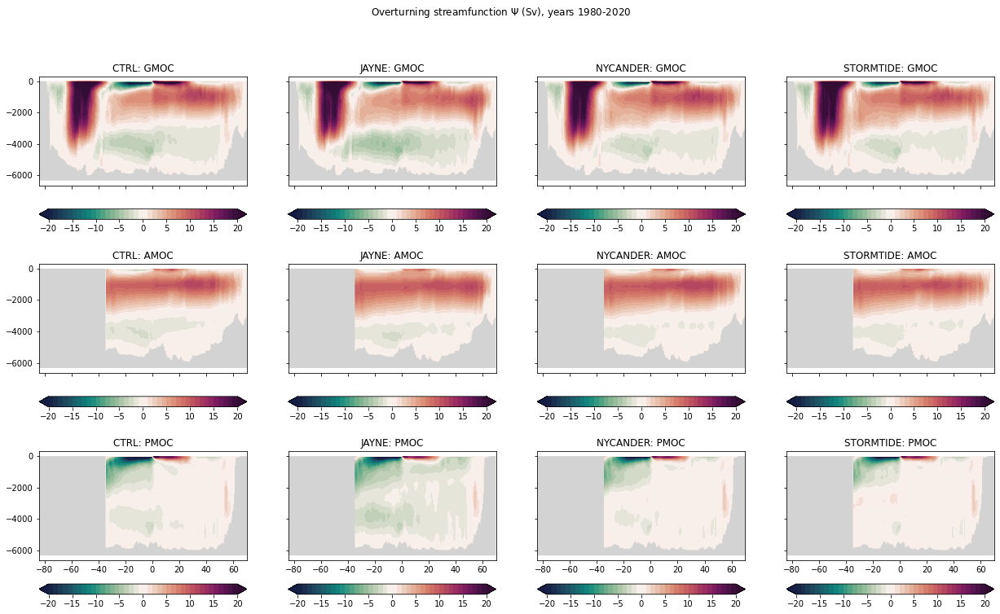

In [19]:
global_mask, atlantic_mask, indopacific_mask = make_masks(coords)
fig, ax = plt.subplots(nrows=3,ncols=4,sharex=True,sharey=True,figsize=(21,12))#, subplot_kw={'projection': proj})
for k in range(len(dsm)):
    plotmoc(ax[0,k],dsm[k],     global_mask,tstr=rnames[k]+': GMOC')
    plotmoc(ax[1,k],dsm[k],   atlantic_mask,tstr=rnames[k]+': AMOC')
    plotmoc(ax[2,k],dsm[k],indopacific_mask,tstr=rnames[k]+': PMOC')

#y0,y1 = dss[0].time.isel(time=0),dss[0].time.isel(time=-1)
fig.suptitle('Overturning streamfunction $\Psi$ (Sv), years %s-%s'%(year0,year1))
fig.savefig(os.path.join(fdir,'moc_%s_y%s'%(rname0,yearstr)),dpi=300)

In [20]:
def plotmoc_layers(ax,ds,msk,tstr='dummy'):
    mocstrf, zlayer = compute_moc_layers(ds,msk)
    dd = flat2d(ds.Depth*msk)
    d = dd.max(axis=-1)
    y = xr.concat([coords.YG.isel(face= 0),coords.YG.isel(face= 1),coords.YG.isel(face= 2)], dim='j_g').mean(dim='i_g')
    csf=ax.contourf(y,ds.layer_1RHO_interface,sq(mocstrf[:-1,:])*1e-6,levels=np.linspace(-20,20,41),cmap=cmo.curl, extend='both')
    plt.colorbar(csf,ax=ax,orientation='horizontal',extend='both')
    ax.invert_yaxis()
    ax.set_title('%s'%(tstr))
    plt.axis('tight')
    # ax.set_ylim(ds.layer_1RHO_interface.max(),ds.layer_1RHO_interface.min())
    ax.set_ylim(37.,ds.layer_1RHO_interface.min())
    plt.grid()

In [21]:
from scipy.interpolate import interp1d
remap_d2r=np.hstack([0.00, 
                     np.arange(30.00, 35.99, 1.00),
                     np.arange(36.00, 36.5, 0.20),# 0.15
                     np.arange(36.60, 37.0, 0.05), 40.00])
remap_d2r = np.sort(np.unique(remap_d2r))
remap_d2r_major = np.array([30.00, 36.00, 36.4, 36.6, 36.7, 36.75])
#remap_d2r_major = np.array([30.00, 36.00, 36.65, 36.92])
reg      = np.linspace(0, len(remap_d2r), len(remap_d2r))
#reg      = reg[::-1]
dens2reg = interp1d(remap_d2r, reg      , kind='linear')
reg2dens = interp1d(reg      , remap_d2r, kind='linear')

xy, x_ind, y_ind = np.intersect1d(remap_d2r, remap_d2r_major, return_indices=True)
# --> this will become major tick marks (larger fontsize)
ymajorticks = reg[x_ind] 
ymajorlabel = np.around(reg2dens(ymajorticks), 3).tolist()

def plotmoc_layers2(ax,ds,msk,tstr='dummy'):
    mocstrf, zlayer = compute_moc_layers(ds,msk)
    dd = flat2d(ds.Depth*msk)
    d = dd.max(axis=-1)
    y = xr.concat([coords.YG.isel(face= 0),coords.YG.isel(face= 1),coords.YG.isel(face= 2)], dim='j_g').mean(dim='i_g')
#    csf=ax.contourf(y,ds.layer_1RHO_interface,sq(mocstrf[:-1,:])*1e-6,levels=np.linspace(-20,20,41),cmap=cmo.curl, extend='both')
    rho = dens2reg(ds.layer_1RHO_interface)
#    rho = dens2reg(ds.layer_1RHO_center)
#    rticks_major = np.array([30.00, 36.00, 36.65, 36.92, 37.05])
    yrho = np.linspace(0,len(rho),len(rho))
    csf=ax.contourf(y,rho,sq(mocstrf)[:-1,:]*1e-6,levels=np.linspace(-20,20,41),cmap=cmo.curl, extend='both')
#    ax.set_yticks(yrho) #,labels=rho)
#   ax.set_yticklabels(ds.layer_1RHO_center)
    ax.set_yticks(ymajorticks, labels=ymajorlabel, minor=False) #,labels=rho)
#   ax.set_yticklabels(ymajorlabel, minor=False)
    ax.invert_yaxis()
    plt.colorbar(csf,ax=ax,orientation='horizontal',extend='both')
    ax.set_title('%s'%(tstr))
    plt.axis('tight')
    # ax.set_ylim(ds.layer_1RHO_interface.max(),ds.layer_1RHO_interface.min())
    ax.set_ylim(dens2reg(36.8),dens2reg(ds.layer_1RHO_interface.min()))
    ax.grid()

Text(0.5, 0.98, 'Overturning streamfunction $\\Psi$ (Sv), years 1980-2020')

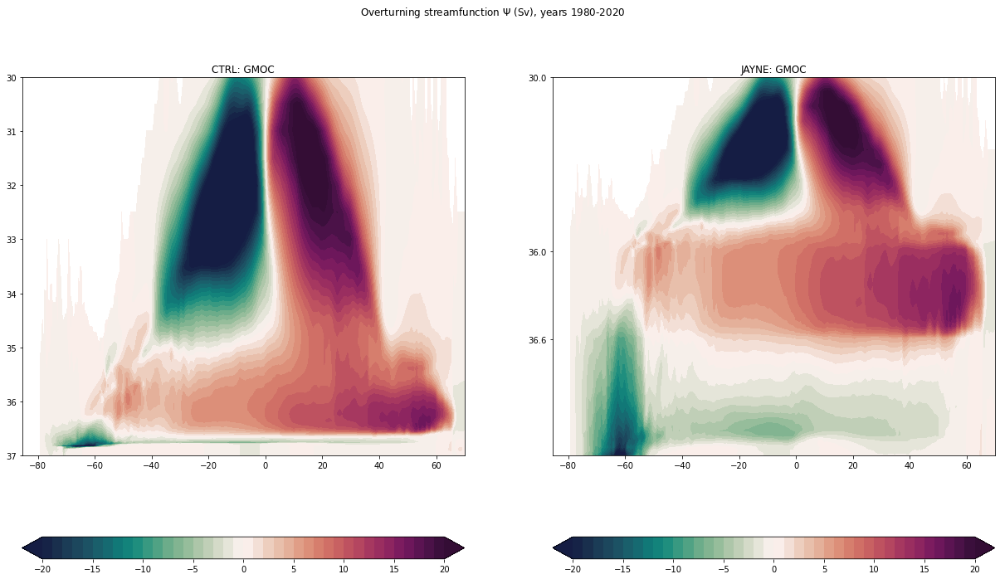

In [32]:
plt.close()
# y0,y1='2144', '2169'
# yearstr=y1
global_mask, atlantic_mask, indopacific_mask = make_masks(coords)

fig, ax = plt.subplots(nrows=1,ncols=2,sharex=True,sharey=False,figsize=(21,12))#, subplot_kw={'projection': proj})
k=0
plotmoc_layers(ax[k],dlm[k],     global_mask,tstr=rnames[k]+': GMOC')
k=1
plotmoc_layers2(ax[k],dlm[0],     global_mask,tstr=rnames[k]+': GMOC')


fig.suptitle('Overturning streamfunction $\Psi$ (Sv), years %s-%s'%(year0,year1))
#fig.savefig(os.path.join(fdir,'moc_layers_%s_y%s'%(rname0,yearstr)),dpi=300)

In [33]:
xy, x_ind, y_ind = np.intersect1d(remap_d2r, remap_d2r_major, return_indices=True)
remap_d2r, remap_d2r_major, x_ind, y_ind, reg[x_ind], np.around(reg2dens(ymajorticks), 3)

(array([ 0.  , 30.  , 31.  , 32.  , 33.  , 34.  , 35.  , 36.  , 36.2 ,
        36.4 , 36.6 , 36.65, 36.7 , 36.75, 36.8 , 36.85, 36.9 , 36.95,
        40.  ]),
 array([30.  , 36.  , 36.4 , 36.6 , 36.7 , 36.75]),
 array([ 1,  7, 10]),
 array([0, 1, 3]),
 array([ 1.05555556,  7.38888889, 10.55555556]),
 array([30. , 36. , 36.6]))

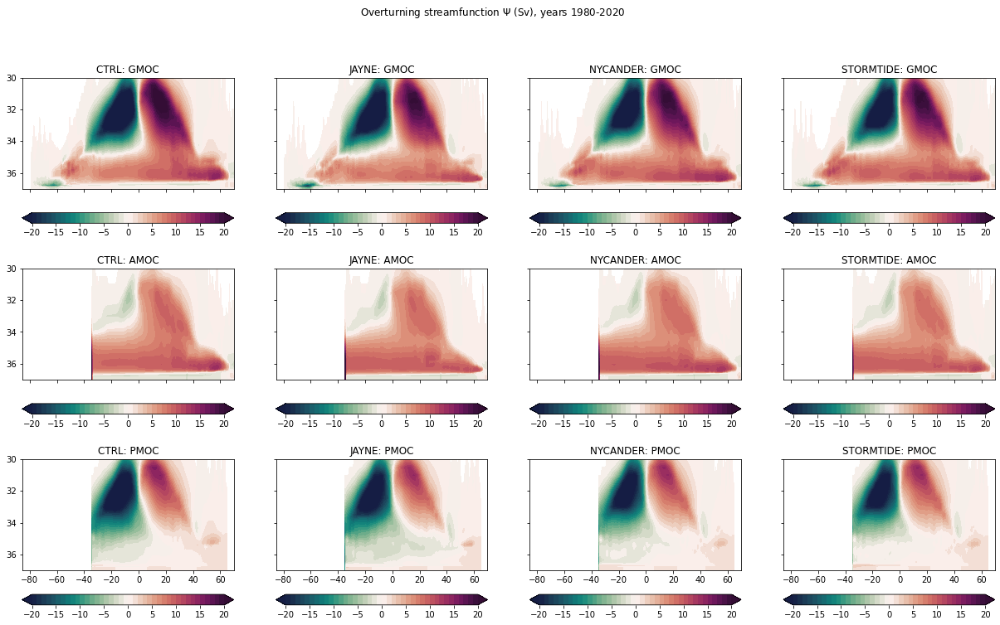

In [22]:
# y0,y1='2144', '2169'
# yearstr=y1
global_mask, atlantic_mask, indopacific_mask = make_masks(coords)

fig, ax = plt.subplots(nrows=3,ncols=4,sharex=True,sharey=True,figsize=(21,12))#, subplot_kw={'projection': proj})
for k in range(len(dlm)):
    plotmoc_layers(ax[0,k],dlm[k],     global_mask,tstr=rnames[k]+': GMOC')
    plotmoc_layers(ax[1,k],dlm[k],   atlantic_mask,tstr=rnames[k]+': AMOC')
    plotmoc_layers(ax[2,k],dlm[k],indopacific_mask,tstr=rnames[k]+': PMOC')
    
fig.suptitle('Overturning streamfunction $\Psi$ (Sv), years %s-%s'%(year0,year1))
fig.savefig(os.path.join(fdir,'moc_layers_%s_y%s'%(rname0,yearstr)),dpi=300)

In [23]:
from scipy.interpolate import interp1d

def plotmoc_remapped(ax,ds,msk,tstr='dummy'):
    mocstrf, zlayer = compute_moc_layers(ds,msk)
    dd = flat2d(ds.Depth*msk)
    d = dd.max(axis=-1)
    y = xr.concat([coords.YG.isel(face= 0),coords.YG.isel(face= 1),coords.YG.isel(face= 2)], dim='j_g').mean(dim='i_g')
    nl = ds.layer_1RHO_center.shape[0]
    yl = np.tile(y.data.reshape((1,y.shape[0])),(nl,1))
    csf=ax.contourf(yl,zlayer,sq(mocstrf)*1e-6,levels=np.linspace(-20,20,41),cmap=cmo.curl, extend='both')
    ylimit=-ds.drF.sum()-200
    ax.fill_between(y,-d,ylimit,step='mid',facecolor='lightgrey')
    ax.set_ylim([ylimit,0])
    plt.colorbar(csf,ax=ax,orientation='horizontal',extend='both')
    ax.set_title('%s'%(tstr))
    ax.grid()
    
def plotmoc_remapped_div(ax,ds,dl,msk,tstr='dummy'):
    mocstrf = compute_moc_layers_div(dl,msk)
    rhoZonalMean = zonal_mean(ds,ds.LaTr1RHO,msk).data
    psir_z = np.zeros(rhoZonalMean.shape)
    # it is cheaper to define the interpolator once and only use part of
    # it than to define a new one for each latitude
    f = interp1d(dl.layer_1RHO_center, mocstrf, axis=0, bounds_error = False, fill_value=0)
    for jj in range(mocstrf.shape[1]):
        psir_z[:,jj] = f(rhoZonalMean[:,jj])[:,jj]

    dd = flat2d(ds.Depth*msk)
    d = dd.max(axis=-1)
    y = xr.concat([coords.YG.isel(face= 0),coords.YG.isel(face= 1),coords.YG.isel(face= 2)], dim='j_g').mean(dim='i_g')
    csf=ax.contourf(y,ds.Z,sq(psir_z)*1e-6,levels=np.linspace(-20,20,41),cmap=cmo.curl, extend='both')
    ylimit=-ds.drF.sum()-200
    ax.fill_between(y,-d,ylimit,step='mid',facecolor='lightgrey')
    ax.set_ylim([ylimit,0])
    plt.colorbar(csf,ax=ax,orientation='horizontal',extend='both')
    ax.set_title('%s'%(tstr))
    ax.grid() 

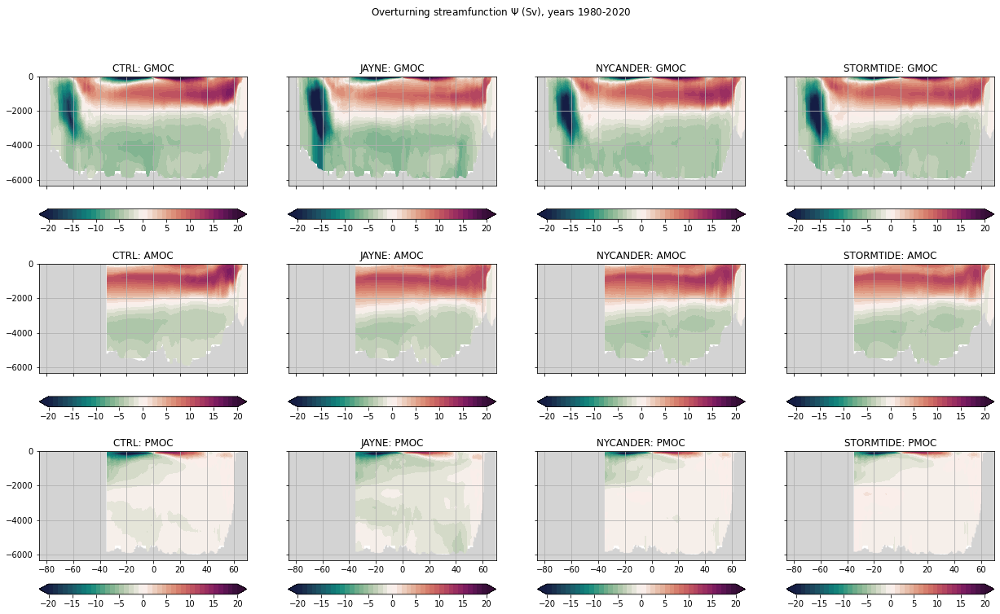

In [24]:
global_mask, atlantic_mask, indopacific_mask = make_masks(coords)

fig, ax = plt.subplots(nrows=3,ncols=4,sharex=True,sharey=True,figsize=(21,12))#, subplot_kw={'projection': proj})
for k in range(len(dlm)):
    plotmoc_remapped_div(ax[0,k],dsm[k],dlm[k],     global_mask,tstr=rnames[k]+': GMOC')
    plotmoc_remapped_div(ax[1,k],dsm[k],dlm[k],   atlantic_mask,tstr=rnames[k]+': AMOC')
    plotmoc_remapped_div(ax[2,k],dsm[k],dlm[k],indopacific_mask,tstr=rnames[k]+': PMOC')

#y0,y1 = dl0.time.isel(time=0),dl0.time.isel(time=-1)
#fig.suptitle('Overturning streamfunction $\Psi$ (Sv), years %s-%s'%(y0.data.astype('datetime64[Y]'),y1.data.astype('datetime64[Y]')))
fig.suptitle('Overturning streamfunction $\Psi$ (Sv), years %s-%s'%(year0,year1))
fig.savefig(os.path.join(fdir,'moc_remapped_%s_y%s'%(rname0,yearstr)),dpi=300)

# time series of overtuning circulation and Drake Passage transport
compute transports: for this we need to load the entire data set

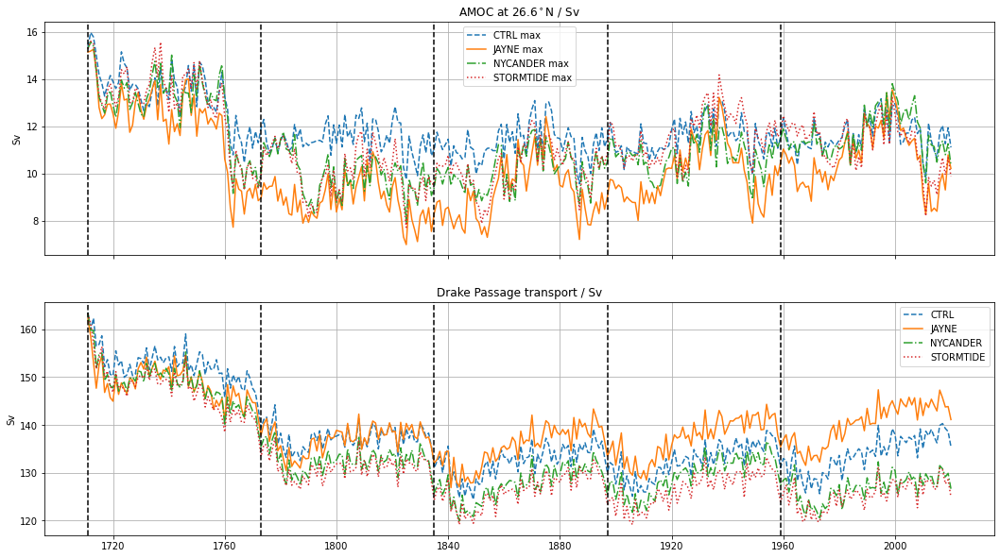

In [25]:
fig, ax = plt.subplots(nrows=2,ncols=1,sharex=True,sharey=False,figsize=(18,10))
#plt.clf()
y = flat2d(grid.YC).mean(axis=-1)
iz = 22 # blow 500m
iy = 165 # northern hemisphere
labs=['--','-','-.',':']
for k, ds in enumerate(dst):
#    ax[0].plot(ds.time,mocstrf[k][:,iz:,iy:].max(axis=1).max(axis=-1),labs[k],label="%s max"%(rnames[k]))
    iy=197 # "YG[197]" = 26.12792604 degN, "YC[197]" = 26.578 degN
    ax[0].plot(ds.time,mocstrf[k][:,iz:,iy].max(axis=1),labs[k],label="%s max"%(rnames[k]))

    # for iy in [195]:
    #     ax[0].plot(ds.time,mocstrf[k][:,iz:,iy].max(axis=1),labs[k],label="%s at %4.1f$^\circ$N"%(rnames[k],y[iy]))
    
    ax[1].plot(ds.time,dp[k],labs[k],label="%s"%(rnames[k]))

ax[0].set_title('AMOC at %4.1f$^\circ$N / Sv'%y[iy])
ax[1].set_title('Drake Passage transport / Sv')

for a in ax:
    a.set_ylabel('Sv')
    a.legend()
    a.grid()
    for x in dst[0].time[0::62]:
        a.axvline(x.data,linestyle='--',color='k')

fig.savefig(os.path.join(fdir,'amoc_timeseries'),dpi=300)

In [35]:
## heat transport

In [37]:
dss[0]

NameError: name 'dss' is not defined

# 2D maps of T/S K, N2 at 1000 m, 2000 m, 3000 m, 4000 m

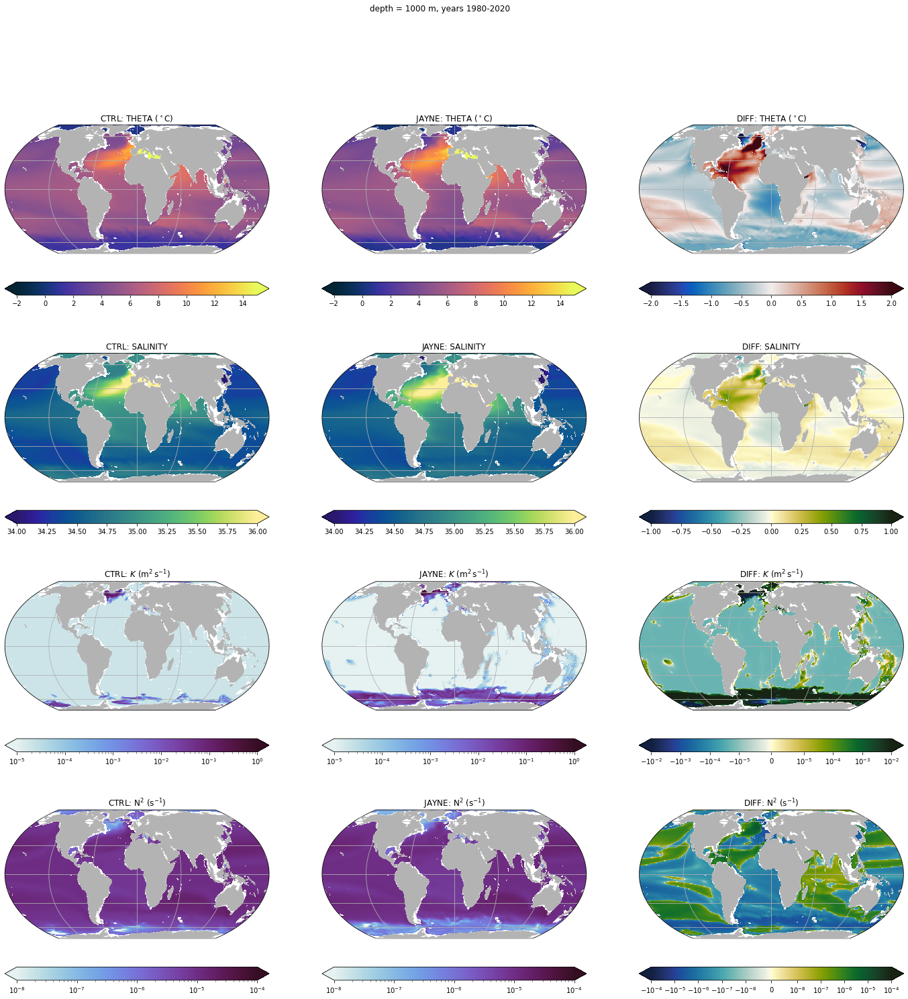

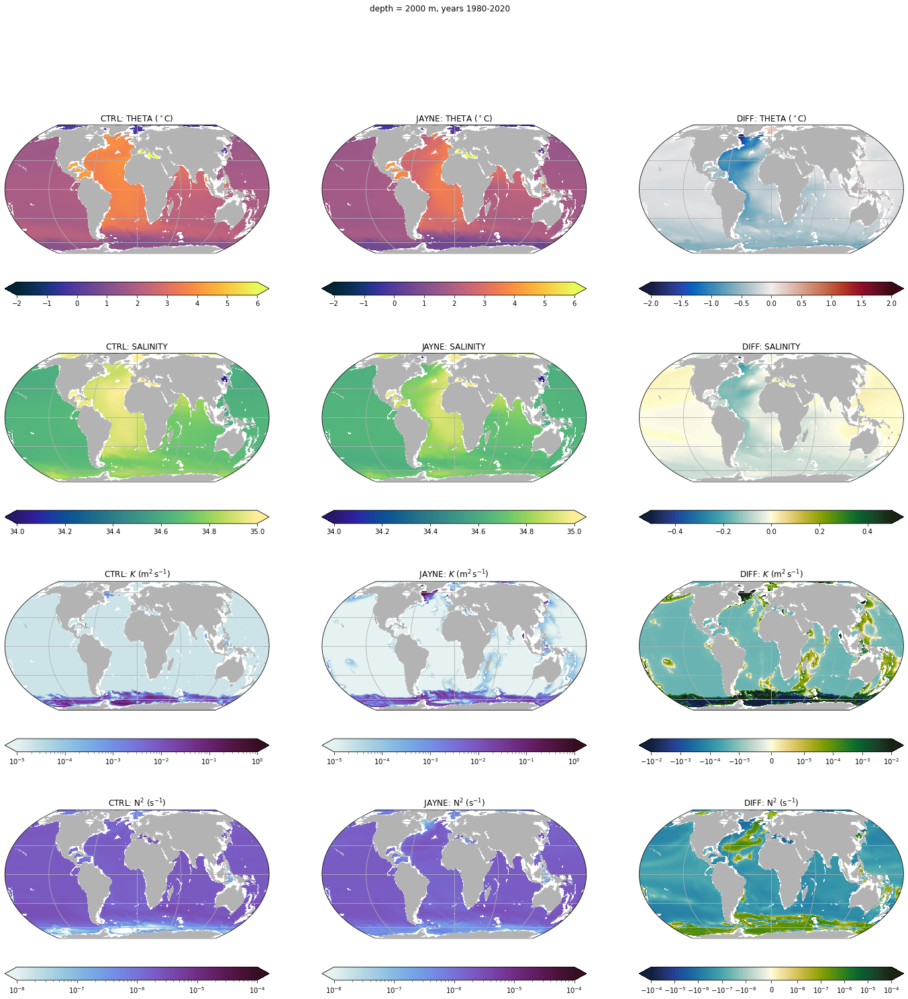

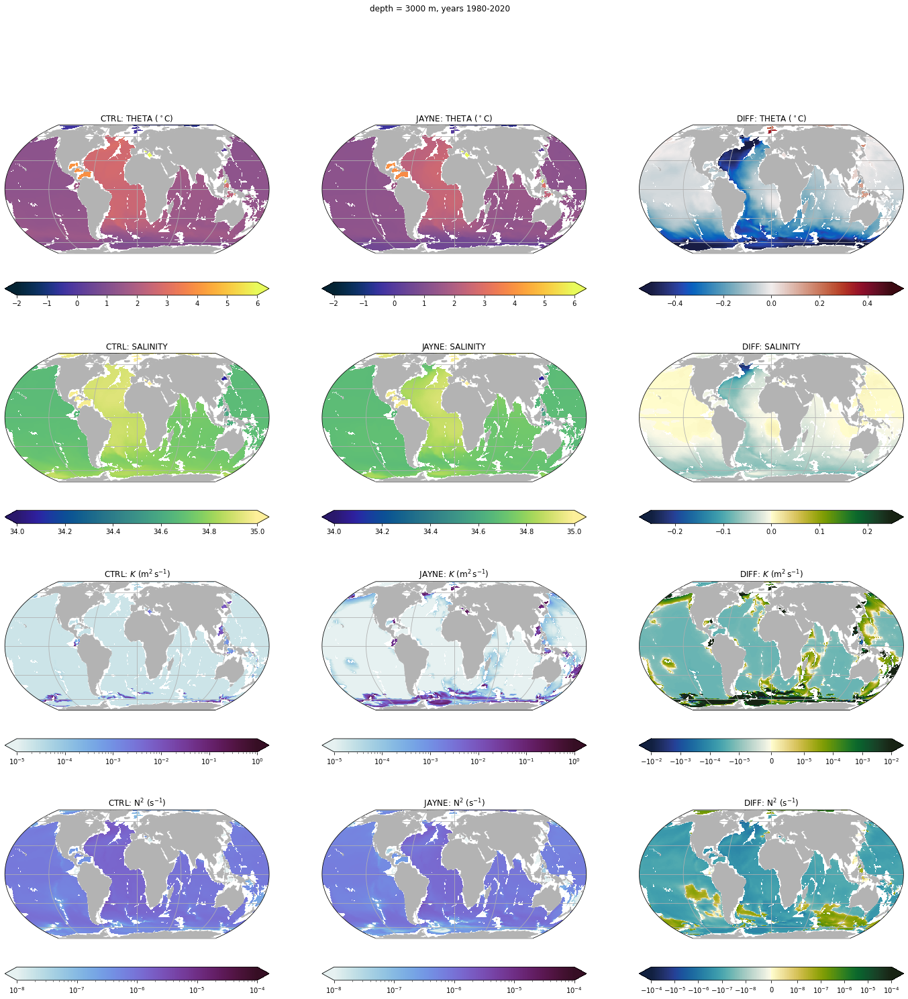

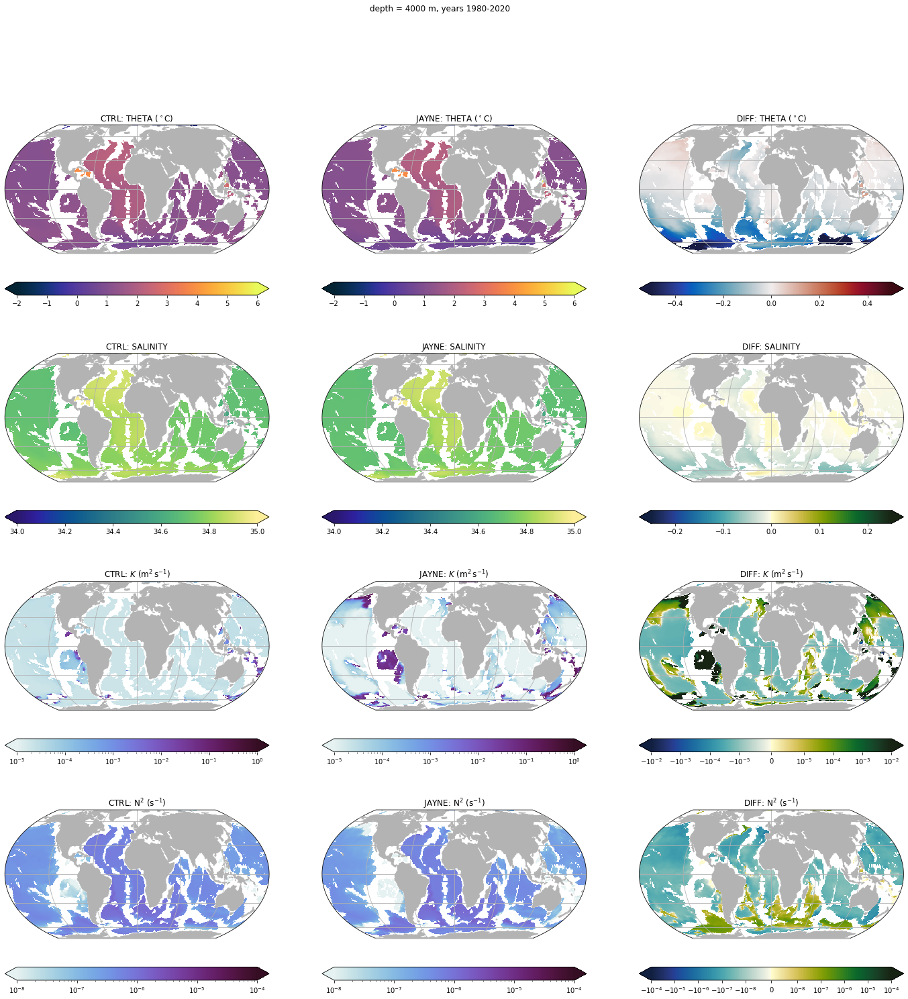

In [26]:
gr = 9.81/1035
#proj=cart.crs.Robinson()#central_longitude=180.0-19) #central_longitude=7.0)
proj=cart.crs.EqualEarth()#central_longitude=180.0-19) #central_longitude=7.0)
#proj=cart.crs.PlateCarree() #central_longitude=161.)

gr = 9.81/1035

dd = dsm[1]-dsm[0]
mask2d=dsm[0].hFacC.isel(k=0)

tmax = [15., 6., 6., 6.]
smax = [36.,35.,35.,35.]
dt =  [2. ,2., 0.5, 0.5 ]
ds =  [1. ,0.5,0.25,0.25]

for kd, depth in enumerate([1000,2000,3000,4000]):
    
    k = ((dsm[0].Z+depth)**2).argmin().values
    mask2d=dsm[0].hFacC.isel(k=k)

    # create instance of LLC-mapper
    mapper = LLCMapper(coords) #, dx=1., dy=1.)

    fig, ax = plt.subplots(nrows=4,ncols=3,sharex=True,sharey=True,figsize=(24,24),subplot_kw={'projection': proj})
    # fig, ax = plt.subplots(nrows=1,ncols=1,sharex=True,sharey=True,figsize=(24,24),subplot_kw={'projection': proj})

    tnorm = colors.Normalize(vmin=-2,vmax=tmax[kd])
    mapper(dsm[0].THETA.sel(k=k).where(mask2d!=0.),ax=ax[0,0],norm=tnorm,        cmap=cmo.thermal,tstr=rname0+': THETA ($^\circ$C)')
    mapper(dsm[1].THETA.sel(k=k).where(mask2d!=0.),ax=ax[0,1],norm=tnorm,        cmap=cmo.thermal,tstr=rname1+': THETA ($^\circ$C)')
    mapper(  dd.THETA.sel(k=k).where(mask2d!=0.),ax=ax[0,2],norm=symNorm(dt[kd]),cmap=cmo.balance,tstr=   'DIFF: THETA ($^\circ$C)')
    # 
    snorm=colors.Normalize(vmin=34,vmax=smax[kd])
    mapper(dsm[0].SALT.sel(k=k).where(mask2d!=0.),ax=ax[1,0],norm=snorm,        cmap=cmo.haline,tstr=rname0+': SALINITY')
    mapper(dsm[1].SALT.sel(k=k).where(mask2d!=0.),ax=ax[1,1],norm=snorm,        cmap=cmo.haline,tstr=rname1+': SALINITY')
    mapper(  dd.SALT.sel(k=k).where(mask2d!=0.),ax=ax[1,2],norm=symNorm(ds[kd]),cmap=cmo.delta, tstr=   'DIFF: SALINITY')
    # 
    knorm=colors.LogNorm(vmin=1e-5,vmax=1.)
    mapper(dsm[0].GGL90Kr.sel(k_l=k).where(mask2d!=0.),ax=ax[2,0],norm=knorm,cmap=cmo.dense,tstr=rname0+': $K$ (m$^{2}\,$s$^{-1}$)')
    mapper(dsm[1].GGL90Kr.sel(k_l=k).where(mask2d!=0.),ax=ax[2,1],norm=knorm,cmap=cmo.dense,tstr=rname1+': $K$ (m$^{2}\,$s$^{-1}$)')
    dnorm=colors.SymLogNorm(linthresh=1e-5, linscale=1,vmin=-1.e-2,vmax=1.e-2)                                                                                                                                
    mapper(  dd.GGL90Kr.sel(k_l=k).where(mask2d!=0.),  ax=ax[2,2],norm=dnorm,cmap=cmo.delta,tstr=   'DIFF: $K$ (m$^{2}\,$s$^{-1}$)')
    #
    nnorm=colors.LogNorm(vmin=1e-8,vmax=1.e-4)
    mapper(-gr*dsm[0].DRHODR.sel(k_l=k).where(mask2d!=0.),ax=ax[3,0],norm=nnorm,cmap=cmo.dense,tstr=rname0+': N$^2$ (s$^{-1}$)')
    mapper(-gr*dsm[1].DRHODR.sel(k_l=k).where(mask2d!=0.),ax=ax[3,1],norm=nnorm,cmap=cmo.dense,tstr=rname1+': N$^2$ (s$^{-1}$)')
    dnorm=colors.SymLogNorm(linthresh=1e-8, linscale=1,vmin=-1.e-4,vmax=1.e-4)
    mapper(-gr*  dd.DRHODR.sel(k_l=k).where(mask2d!=0.),  ax=ax[3,2],norm=dnorm,cmap=cmo.delta,tstr=   'DIFF: N$^2$ (s$^{-1}$)')

    
    # y0,y1 = d00.time.isel(time=0),d00.time.isel(time=-1)
    # fig.suptitle('depth = %i m, years %s-%s'%(depth,y0.data.astype('datetime64[Y]'),y1.data.astype('datetime64[Y]')))
    fig.suptitle('depth = %i m, years %s-%s'%(depth,year0,year1))
    fig.savefig(os.path.join(fdir,'%s_%im_y%s'%('map2d',depth,yearstr)),dpi=300)


# zonally averated salinity/temperature/$\kappa$/$N^2$/$\kappa\,N^2$

In [27]:
#plt.close('all')
import matplotlib.ticker as mtick
#mytindex = ds1.time.shape[0]-1

def format_func(x,pos):
    mystr = "%1.0e"%x
    return mystr

def plotzonalmean(ax,ds,fld,levs,msk=1.,tstr='dummy',cmap=None):
    # compute zonal mean along grid lines for now:
    y = flat2d(grid.YC).mean(axis=-1)
    fld0 = zonal_mean(ds,fld,msk)
    d = flat2d(ds.Depth*msk).max(axis=-1)
    if 'k_l' in fld.dims:
        # in this case we assume that we want to plot logarithmic color scales
        z = ds.Zl
        tickformat=mtick.LogFormatter()
        useLog=True
        if levs[0]>0:
            cnorm = colors.LogNorm(levs[0],levs[-1])
        else:
            # special trick, when logarithmic levels are negative use symmetric log scale
            cnorm = colors.SymLogNorm(linthresh=np.abs(levs[0]), linscale=2,
                                      vmin=-np.abs(levs[-1]),vmax=np.abs(levs[-1]))        
            levs = np.hstack((np.flip(levs),-levs))
            # cnorm = colors.Normalize(vmin=-np.abs(levs[-1]),vmax=np.abs(levs[-1]))        
            tickformat=mtick.FuncFormatter(format_func)
    else:
        z = ds.Z
        useLog=False
        cnorm = None
    csf=ax.contourf(y,z,fld0,levels=levs,norm=cnorm,extend='both',cmap=cmap)
    ax.contour(y,z,fld0,levels=levs,colors='gray',linewidths=0.25)
    ax.fill_between(y,-d,-ds.Depth.max()-200.,step='mid',facecolor='lightgrey')
    if useLog:
        plt.colorbar(csf,ax=ax,orientation='horizontal',format=tickformat)
    else:
        plt.colorbar(csf,ax=ax,orientation='horizontal')
    ax.set_title('%s'%(tstr))

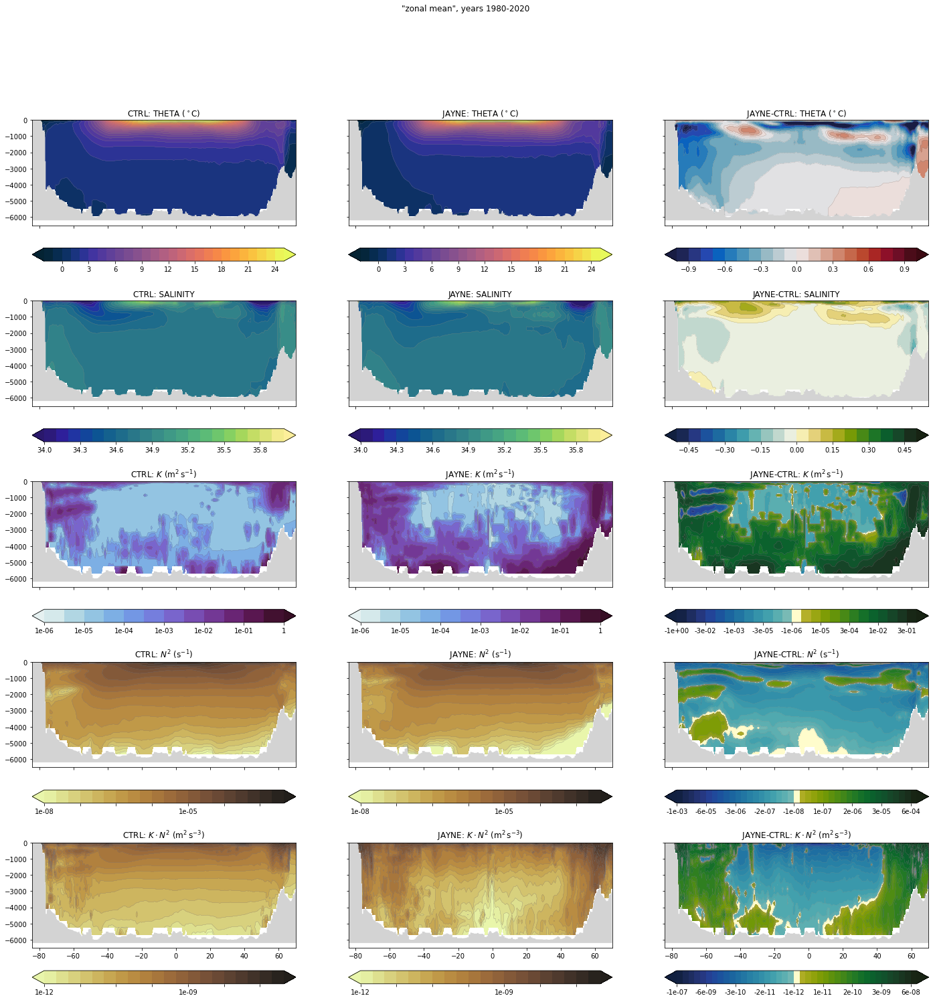

In [28]:
dd = dsm[1]-dsm[0]
# N2 = - gravity/rho0 * DRHODR 
gr = 9.81/1035

global_mask, atlantic_mask, indopacific_mask = make_masks(coords)

fig,ax=plt.subplots(5,3,figsize=(24,24),sharex=True,sharey=True);
#
plotzonalmean(ax[0,0],dsm[0],dsm[0].THETA,np.linspace(-2,25,28),global_mask,  '%s: THETA ($^\circ$C)'%rname0,cmap=cmo.thermal)
plotzonalmean(ax[0,1],dsm[1],dsm[1].THETA,np.linspace(-2,25,28),global_mask,  '%s: THETA ($^\circ$C)'%rname1,cmap=cmo.thermal)
plotzonalmean(ax[0,2],dsm[0],  dd.THETA,np.linspace(-1,1,21), global_mask,'%s-%s: THETA ($^\circ$C)'%(rname1,rname0),cmap=cmo.balance)
#
plotzonalmean(ax[1,0],dsm[0],dsm[0].SALT, np.linspace(34,36,21),global_mask,    '%s: SALINITY'%rname0,cmap=cmo.haline)
plotzonalmean(ax[1,1],dsm[1],dsm[1].SALT, np.linspace(34,36,21),global_mask,    '%s: SALINITY'%rname1,cmap=cmo.haline)
plotzonalmean(ax[1,2],dsm[0],  dd.SALT, np.linspace(-.5,.5,21),global_mask,'%s-%s: SALINITY'%(rname1,rname0),cmap=cmo.delta)
#
knorm = np.logspace(-6,0,13)
plotzonalmean(ax[2,0],dsm[0],dsm[0].GGL90Kr, knorm,global_mask,    '%s: $K$ (m$^{2}\,$s$^{-1}$)'%rname0,cmap=cmo.dense)
plotzonalmean(ax[2,1],dsm[1],dsm[1].GGL90Kr, knorm,global_mask,    '%s: $K$ (m$^{2}\,$s$^{-1}$)'%rname1,cmap=cmo.dense)
plotzonalmean(ax[2,2],dsm[1],  dd.GGL90Kr,-knorm,global_mask,'%s-%s: $K$ (m$^{2}\,$s$^{-1}$)'%(rname1,rname0),cmap=cmo.delta)
#
rnorm = np.logspace(-8,-3,21)
plotzonalmean(ax[3,0],dsm[0],abs(-gr*dsm[0].DRHODR),rnorm,global_mask,   '%s: $N^2$ (s$^{-1}$)'%rname0,cmap=cmo.turbid)
plotzonalmean(ax[3,1],dsm[1],abs(-gr*dsm[1].DRHODR),rnorm,global_mask,   '%s: $N^2$ (s$^{-1}$)'%rname1,cmap=cmo.turbid)
plotzonalmean(ax[3,2],dsm[0],-gr*(dd.DRHODR),    -rnorm,global_mask,'%s-%s: $N^2$ (s$^{-1}$)'%(rname1,rname0),cmap=cmo.delta)
#
nnorm=np.logspace(-12,-7,21)
plotzonalmean(ax[4,0],dsm[0],abs(dsm[0].GGL90KN2),nnorm,global_mask,   '%s: $K\cdot N^2$ (m$^{2}\,$s$^{-3}$)'%rname0,cmap=cmo.turbid)
plotzonalmean(ax[4,1],dsm[1],abs(dsm[1].GGL90KN2),nnorm,global_mask,   '%s: $K\cdot N^2$ (m$^{2}\,$s$^{-3}$)'%rname1,cmap=cmo.turbid)
plotzonalmean(ax[4,2],dsm[0],     dd.GGL90KN2 ,-nnorm,global_mask,'%s-%s: $K\cdot N^2$ (m$^{2}\,$s$^{-3}$)'%(rname1,rname0),cmap=cmo.delta)

#y0,y1 = d00.time.isel(time=0),d00.time.isel(time=-1)
#fig.suptitle('"zonal mean", years %s-%s'%(y0.data.astype('datetime64[Y]'),y1.data.astype('datetime64[Y]')))
fig.suptitle('"zonal mean", years %s-%s'%(year0,year1))
fig.savefig(os.path.join(fdir,'%s_y%s'%('zonal_mean',yearstr)),dpi=300)

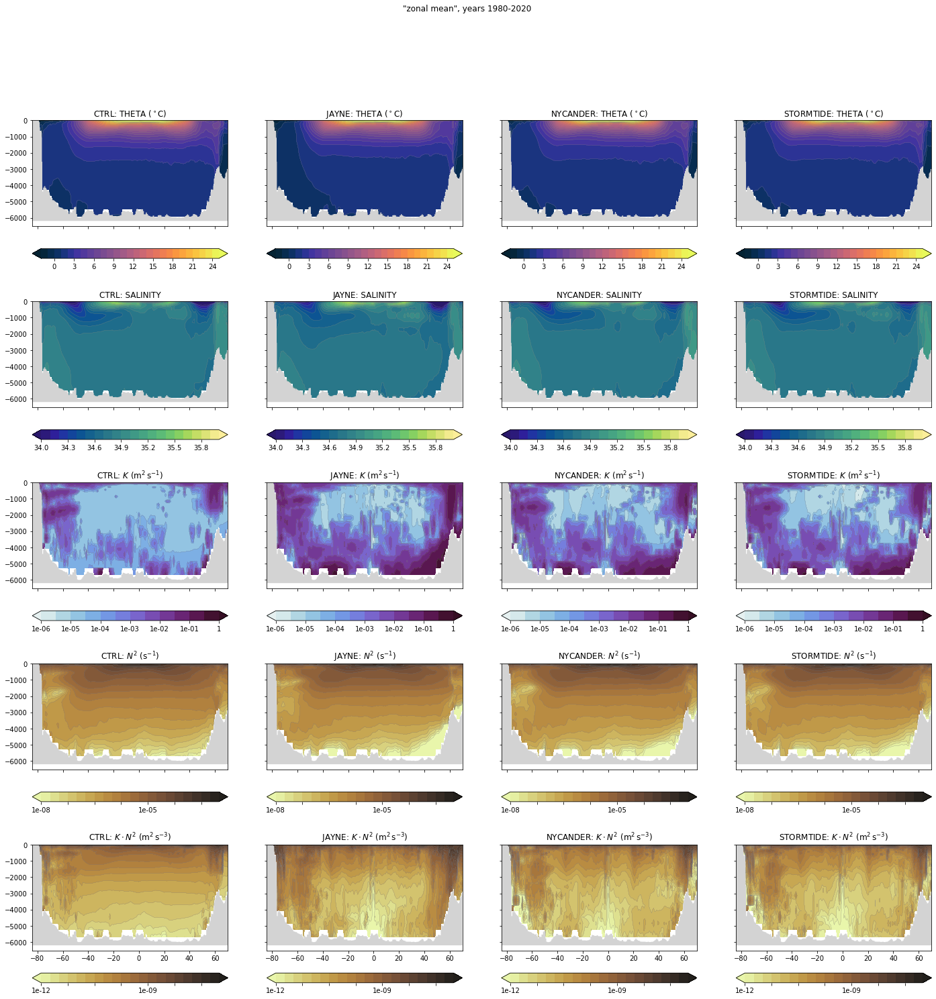

In [29]:
# N2 = - gravity/rho0 * DRHODR 
gr = 9.81/1035

global_mask, atlantic_mask, indopacific_mask = make_masks(coords)

fig,ax=plt.subplots(5,4,figsize=(24,24),sharex=True,sharey=True);
#
tnorm = np.linspace(-2,25,28)
snorm = np.linspace(34,36,21)
knorm = np.logspace(-6,0,13)
rnorm = np.logspace(-8,-3,21)
nnorm=np.logspace(-12,-7,21)
for k in range(len(dsm)):
    plotzonalmean(ax[0,k],dsm[k],dsm[k].THETA,          tnorm,global_mask,              '%s: THETA ($^\circ$C)'%rnames[k],cmap=cmo.thermal)
    #
    plotzonalmean(ax[1,k],dsm[k],dsm[k].SALT,           snorm,global_mask,                       '%s: SALINITY'%rnames[k],cmap=cmo.haline)
    #
    plotzonalmean(ax[2,k],dsm[k],dsm[k].GGL90Kr,        knorm,global_mask,         '%s: $K$ (m$^{2}\,$s$^{-1}$)'%rnames[k],cmap=cmo.dense)
    #
    plotzonalmean(ax[3,k],dsm[k],abs(-gr*dsm[k].DRHODR),rnorm,global_mask,                '%s: $N^2$ (s$^{-1}$)'%rnames[k],cmap=cmo.turbid)
    #
    plotzonalmean(ax[4,k],dsm[k],abs(dsm[k].GGL90KN2),  nnorm,global_mask,'%s: $K\cdot N^2$ (m$^{2}\,$s$^{-3}$)'%rnames[k],cmap=cmo.turbid)

#y0,y1 = d00.time.isel(time=0),d00.time.isel(time=-1)
#fig.suptitle('"zonal mean", years %s-%s'%(y0.data.astype('datetime64[Y]'),y1.data.astype('datetime64[Y]')))
fig.suptitle('"zonal mean", years %s-%s'%(year0,year1))
fig.savefig(os.path.join(fdir,'%s_5x4_y%s'%('zonal_mean',yearstr)),dpi=300)

## biases relative to PHC 3.0 annual mean

done with interpolation
done with interpolation
done with interpolation
done with interpolation
done with interpolation
done with interpolation
done with interpolation
done with interpolation


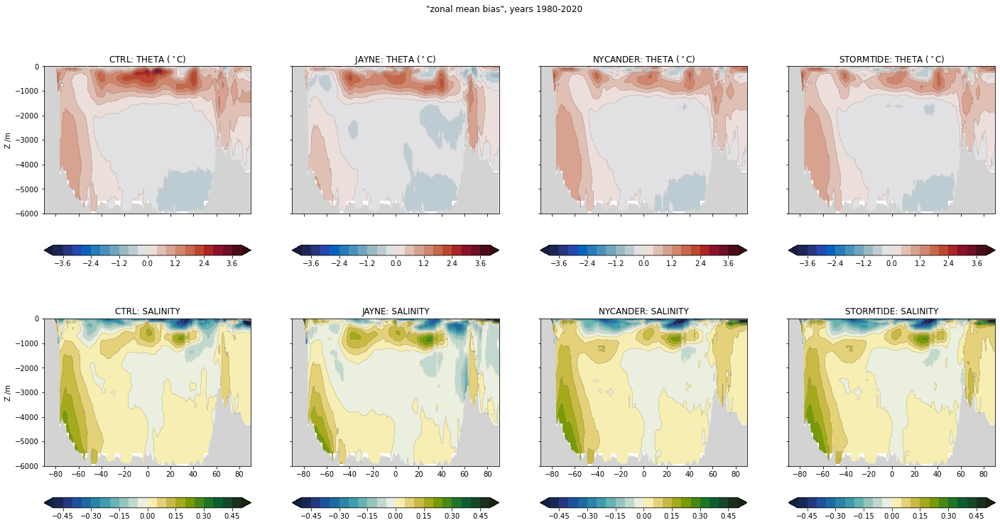

In [30]:
f = open('/home/ollie/mlosch/idemix_forcing/temp_annual_phc3.0.llc90.bin','r')
tphc = mdsTo13faces(np.fromfile(f,'>f4').reshape((50,1170,90)))
f.close()

f = open('/home/ollie/mlosch/idemix_forcing/salt_annual_phc3.0.llc90.bin','r')
sphc = mdsTo13faces(np.fromfile(f,'>f4').reshape((50,1170,90)))
f.close()

global_mask, atlantic_mask, indopacific_mask = make_masks(coords)

llcinterp2d = LLCinterp(coords, dx=0.25, dy=0.25)

def plotzonalbias(ax,ds,dfield,levs,msk=1.,tstr='dummy',cmap=None):

    lon = llcinterp2d.new_grid_lon
    lat = llcinterp2d.new_grid_lat

    d = llcinterp2d(ds.Depth*msk).max(axis=-1)
    y = lat[:,0]
    z = ds.Z
    
    nny,nnx=lat.shape
    nz = dfield.shape[0]
    dfld=np.zeros((nz,nny,nnx))
    for k in range(nz):
        #print('level %i'%k)
        dfld[k,...] = llcinterp2d(dfield[k,...])
        
    print('done with interpolation')

    dfld = np.ma.masked_array(dfld,dfld==0.)
    dfldx = dfld.mean(axis=-1)
    
    useLog=False
    cnorm = None
    csf=ax.contourf(y,z,dfldx,levels=levs,norm=cnorm,extend='both',cmap=cmap)
    ax.contour(y,z,dfldx,levels=levs,colors='gray',linewidths=0.25)
    ax.fill_between(y,-d,-ds.drF.sum(),step='mid',facecolor='lightgrey')
    if useLog:
        plt.colorbar(csf,ax=ax,orientation='horizontal',format=tickformat)
    else:
        plt.colorbar(csf,ax=ax,orientation='horizontal')
    ax.set_title('%s'%(tstr))
    ax.set_xlim([-90,90])
    ax.set_ylim([-6000,0])


fig,ax=plt.subplots(2,4,figsize=(24,12),sharex=True,sharey=True);
#
tnorm = np.linspace(-4,4,21)
snorm = np.linspace(-.5,.5,21)

for k in range(len(dsm)):
    plotzonalbias(ax[0,k],dsm[k],dsm[k].THETA-tphc, tnorm, 1.,'%s: THETA ($^\circ$C)'%rnames[k],cmap=cmo.balance)
    #
    plotzonalbias(ax[1,k],dsm[k],dsm[k].SALT -sphc, snorm, 1.,         '%s: SALINITY'%rnames[k],cmap=cmo.delta)


ax[0,0].set_ylabel('Z /m')
ax[1,0].set_ylabel('Z /m')
#y0,y1 = d00.time.isel(time=0),d00.time.isel(time=-1)
#fig.suptitle('"zonal mean", years %s-%s'%(y0.data.astype('datetime64[Y]'),y1.data.astype('datetime64[Y]')))
fig.suptitle('"zonal mean bias", years %s-%s'%(year0,year1))
fig.savefig(os.path.join(fdir,'%s_2x4_y%s'%('zonal_mean_bias',yearstr)),dpi=300)

## potential density

In [31]:
#plt.close(fig)
def plotzonalmeanp(ax,ds,fld,levs,msk=1.,tstr='dummy',cmap=None):
    # compute zonal mean along grid lines for now:
    y = flat2d(grid.YC).mean(axis=-1)
    fld0 = zonal_mean(ds,fld,msk)
    d = flat2d(ds.Depth*msk).max(axis=-1)
    z = ds.Z
    useLog=False
    cnorm = colors.Normalize(levs[0],vmax=levs[-1])
    csf=ax.pcolormesh(y,z,sq(fld0),norm=cnorm,cmap=cmap)
    ax.contour(y,z,fld0,levels=levs,colors='w',linewidths=0.25)
    ax.fill_between(y,-d,-ds.Depth.max()-200.,step='mid',facecolor='lightgrey')
    if useLog:
        plt.colorbar(csf,ax=ax,orientation='horizontal',format=tickformat)
    else:
        plt.colorbar(csf,ax=ax,orientation='horizontal')
    ax.set_title('%s'%(tstr))

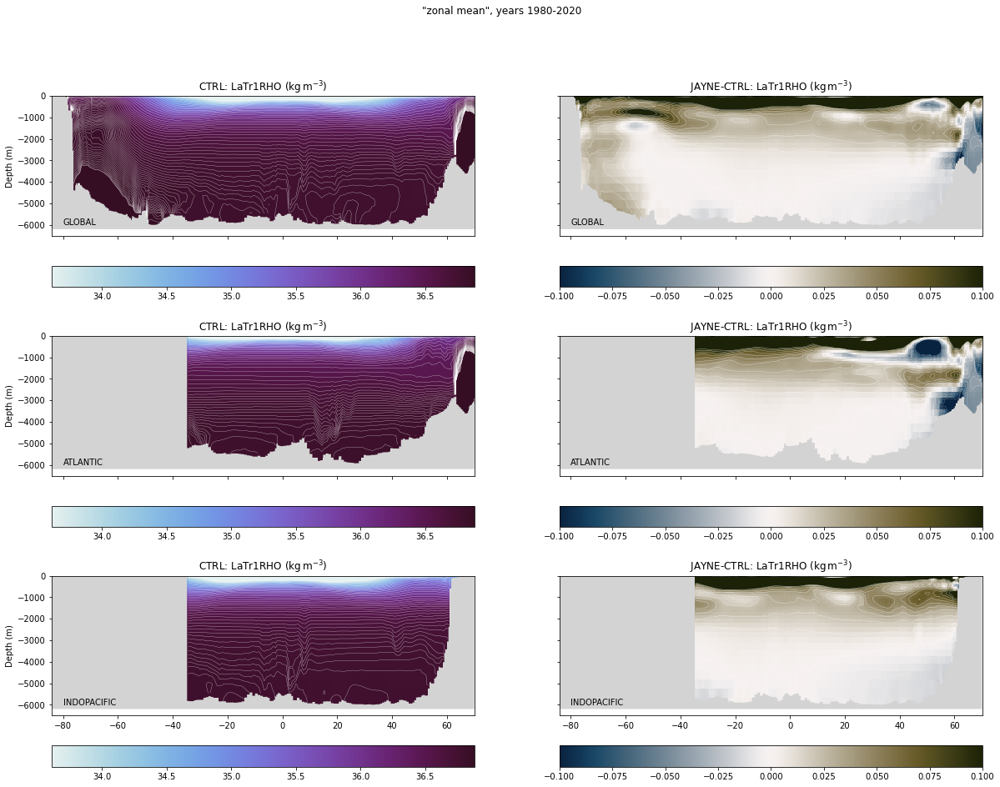

In [32]:
global_mask, atlantic_mask, indopacific_mask = make_masks(coords)

fig,ax=plt.subplots(3,2,figsize=(20,15),sharex=True,sharey=True);
# get density levels from dataset
#dsm[0].layer_1RHO_bounds
dd = dsm[1]-dsm[0]
#
plotzonalmeanp(ax[0,0],dsm[0],dsm[0].LaTr1RHO,dsm[0].layer_1RHO_interface[8:-8],global_mask,   '%s: LaTr1RHO (kg$\,$m$^{-3}$)'%rname0,cmap=cmo.dense)
# plotzonalmeanp(ax[0,1],dsm[1],dsm[1].LaTr1RHO,dsm[1].layer_1RHO_bounds,global_mask, '%s: LaTr1RHO (kg$\,$m$^{-3}$)'%rname1,cmap=cmo.dense)
plotzonalmeanp(ax[0,1],dsm[0],  dd.LaTr1RHO,         np.linspace(-.1,.1,21),global_mask,'%s-%s: LaTr1RHO (kg$\,$m$^{-3}$)'%(rname1,rname0),cmap=cmo.diff)
# 
plotzonalmeanp(ax[1,0],dsm[0],dsm[0].LaTr1RHO,dsm[0].layer_1RHO_interface[8:-8],atlantic_mask,   '%s: LaTr1RHO (kg$\,$m$^{-3}$)'%rname0,cmap=cmo.dense)
# plotzonalmeanp(ax[1,1],dsm[1],dsm[1].LaTr1RHO,dsm[1].layer_1RHO_bounds,atlantic_mask,  '%s: LaTr1RHO (kg$\,$m$^{-3}$)'%rname1,cmap=cmo.dense)
plotzonalmeanp(ax[1,1],dsm[0],  dd.LaTr1RHO,       np.linspace(-.1,.1,21),  atlantic_mask,'%s-%s: LaTr1RHO (kg$\,$m$^{-3}$)'%(rname1,rname0),cmap=cmo.diff)
#
plotzonalmeanp(ax[2,0],dsm[0],dsm[0].LaTr1RHO,dsm[0].layer_1RHO_interface[8:-8],indopacific_mask,   '%s: LaTr1RHO (kg$\,$m$^{-3}$)'%rname0,cmap=cmo.dense)
# plotzonalmeanp(ax[2,1],dsm[1],dsm[1].LaTr1RHO,dsm[1].layer_1RHO_bounds,indopacific_mask,  '%s: LaTr1RHO (kg$\,$m$^{-3}$)'%rname1,cmap=cmo.dense)
plotzonalmeanp(ax[2,1],dsm[0],  dd.LaTr1RHO,       np.linspace(-.1,.1,21),  indopacific_mask,'%s-%s: LaTr1RHO (kg$\,$m$^{-3}$)'%(rname1,rname0),cmap=cmo.diff)

for b in ax[:,0]: b.set_ylabel('Depth (m)')
for b in ax[0,:]: b.text(-80,-6000,'GLOBAL')
for b in ax[1,:]: b.text(-80,-6000,'ATLANTIC')
for b in ax[2,:]: b.text(-80,-6000,'INDOPACIFIC')

# ax[1,2].set_ylabel('Atlantic')
# ax[1,2].yaxis.set_label_position('right')
#

fig.suptitle('"zonal mean", years %s-%s'%(year0,year1))
fig.savefig(os.path.join(fdir,'%s_y%s'%('density_zonal_mean',yearstr)),dpi=300)

compute density from theta/salt/pressure

In [ ]:
global_mask, atlantic_mask, indopacific_mask = make_masks(coords)

import seawater as sw

def sig2(ds):
    import seawater as sw
    # pref = 2084*9.81*1035*1e-4 # fortran level 38
    pref = 1914*9.81*1035*1e-4 # fortran level 37
    return sw.dens(ds.SALT,ds.THETA,pref)-1000.

fig,ax=plt.subplots(3,2,figsize=(20,15),sharex=True,sharey=True);
# get density levels from dataset
#dsm[0].layer_1RHO_bounds
# from compute density
dd = dsm[1]-dsm[0]
#
plotzonalmeanp(ax[0,0],dsm[0],sig2(dsm[0]),   dsm[0].layer_1RHO_interface[8:-8],global_mask, '%s: $\sigma_2$ (kg$\,$m$^{-3}$)'%rname0,cmap=cmo.dense)
plotzonalmeanp(ax[0,1],dsm[0],dsm[0].LaTr1RHO,dsm[1].layer_1RHO_interface[8:-8],global_mask, '%s: LaTr1RHO (kg$\,$m$^{-3}$)'%rname0,cmap=cmo.dense)
# plotzonalmeanp(ax[0,1],dsm[0],  dd.LaTr1RHO,         np.linspace(-.1,.1,21),global_mask,'%s-%s: LaTr1RHO (kg$\,$m$^{-3}$)'%(rname1,rname0),cmap=cmo.diff)
# 
plotzonalmeanp(ax[1,0],dsm[0],sig2(dsm[0]),   dsm[0].layer_1RHO_interface[8:-8],atlantic_mask,  '%s: $\sigma_2$ (kg$\,$m$^{-3}$)'%rname0,cmap=cmo.dense)
plotzonalmeanp(ax[1,1],dsm[0],dsm[0].LaTr1RHO,dsm[0].layer_1RHO_interface[8:-8],atlantic_mask,  '%s: LaTr1RHO (kg$\,$m$^{-3}$)'%rname0,cmap=cmo.dense)
# plotzonalmeanp(ax[1,1],dsm[0],  dd.LaTr1RHO,       np.linspace(-.1,.1,21),  atlantic_mask,'%s-%s: LaTr1RHO (kg$\,$m$^{-3}$)'%(rname1,rname0),cmap=cmo.diff)
# #
plotzonalmeanp(ax[2,0],dsm[0],sig2(dsm[0]),   dsm[0].layer_1RHO_interface[8:-8],indopacific_mask,   '%s: $\sigma_2$ (kg$\,$m$^{-3}$)'%rname0,cmap=cmo.dense)
plotzonalmeanp(ax[2,1],dsm[0],dsm[0].LaTr1RHO,dsm[0].layer_1RHO_interface[8:-8],indopacific_mask,   '%s: LaTr1RHO (kg$\,$m$^{-3}$)'%rname0,cmap=cmo.dense)
# plotzonalmeanp(ax[2,1],dsm[0],  dd.LaTr1RHO,       np.linspace(-.1,.1,21),  indopacific_mask,'%s-%s: LaTr1RHO (kg$\,$m$^{-3}$)'%(rname1,rname0),cmap=cmo.diff)

for b in ax[:,0]: b.set_ylabel('Depth (m)')
for b in ax[0,:]: b.text(-80,-6000,'GLOBAL')
for b in ax[1,:]: b.text(-80,-6000,'ATLANTIC')
for b in ax[2,:]: b.text(-80,-6000,'INDOPACIFIC')

# ax[1,2].set_ylabel('Atlantic')
# ax[1,2].yaxis.set_label_position('right')
#

fig.suptitle('"zonal mean", years %s-%s'%(year0,year1))
# fig.savefig(os.path.join(fdir,'%s_y%s'%('density_zonal_mean',yearstr)),dpi=300)

# Monthly averages

## Mixed layer depths

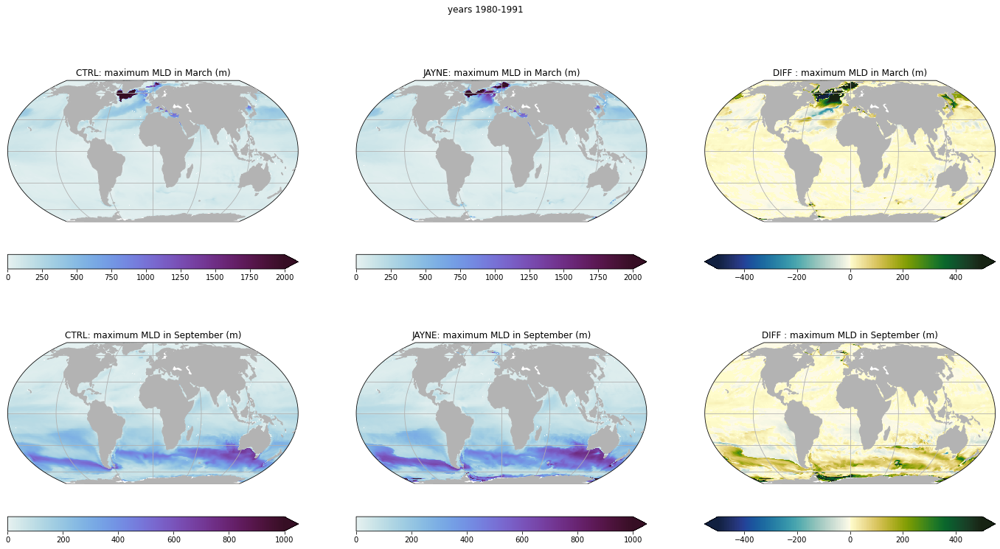

In [20]:
# proj=cart.crs.EqualEarth()#central_longitude=180.0-19) #central_longitude=7.0)
# #proj=cart.crs.PlateCarree() #central_longitude=161.)

# k1=1
# k0=0
# dd = monthlyMaxMLD[k1] - monthlyMaxMLD[k0]
# mask2d=(dm[0].hFacC.isel(k=0)!=0.).compute()
# # create instance of LLC-mapper
# mapper = LLCMapper(coords) #, dx=1., dy=1.)

# fig, ax = plt.subplots(nrows=2,ncols=3,sharex=True,sharey=True,figsize=(24,12),subplot_kw={'projection': proj})

# # March
# mlnorm = colors.Normalize(vmin=0,vmax=2000)
# mapper(monthlyMaxMLD[k0].sel(month=3).MXLDEPTH.where(mask2d),ax=ax[0,0],norm=mlnorm,cmap=cmo.dense,
#        tstr=rname0+': maximum MLD in March (m)')
# mapper(monthlyMaxMLD[k1].sel(month=3).MXLDEPTH.where(mask2d),ax=ax[0,1],norm=mlnorm,cmap=cmo.dense,
#        tstr=rname1+': maximum MLD in March (m)')
# dmnorm = colors.Normalize(vmin=-500,vmax=500)
# mapper(               dd.sel(month=3).MXLDEPTH.where(mask2d),ax=ax[0,2],norm=dmnorm,cmap=cmo.delta,
#        tstr=  'DIFF : maximum MLD in March (m)')
# # September
# mlnorm = colors.Normalize(vmin=0,vmax=1000)
# mapper(monthlyMaxMLD[k0].sel(month=9).MXLDEPTH.where(mask2d),ax=ax[1,0],norm=mlnorm,cmap=cmo.dense,
#        tstr=rname0+': maximum MLD in September (m)')
# mapper(monthlyMaxMLD[k1].sel(month=9).MXLDEPTH.where(mask2d),ax=ax[1,1],norm=mlnorm,cmap=cmo.dense,
#        tstr=rname1+': maximum MLD in September (m)')
# # dmnorm = colors.Normalize(vmin=-300,vmax=300)
# mapper(               dd.sel(month=9).MXLDEPTH.where(mask2d),ax=ax[1,2],norm=dmnorm,cmap=cmo.delta,
#        tstr=  'DIFF : maximum MLD in September (m)')

# fig.suptitle('years %s-%s'%(year0,year1))
# fig.savefig(os.path.join(fdir,'max_mld_y%s'%(year1)),dpi=300)

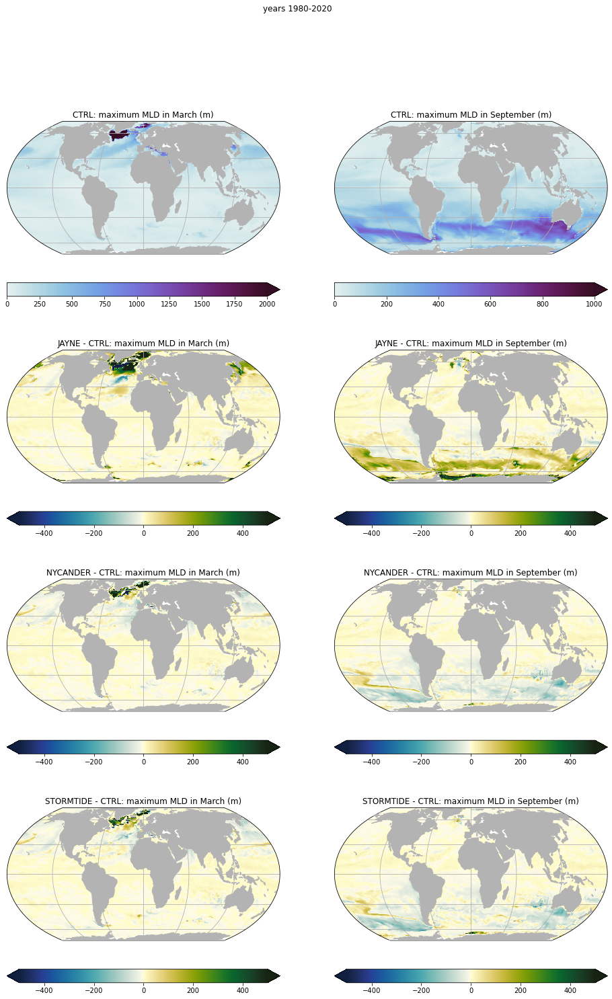

In [35]:
proj=cart.crs.EqualEarth()#central_longitude=180.0-19) #central_longitude=7.0)
#proj=cart.crs.PlateCarree() #central_longitude=161.)

k0=0
#dd = monthlyMaxMLD[k1] - monthlyMaxMLD[k0]
mask2d=(dm[0].hFacC.isel(k=0)!=0.).compute()
# create instance of LLC-mapper
mapper = LLCMapper(coords) #, dx=1., dy=1.)

fig, ax = plt.subplots(nrows=4,ncols=2,sharex=True,sharey=True,figsize=(16,24),subplot_kw={'projection': proj})

for k in range(len(monthlyMaxMLD)):
    # March
    mlnorm = colors.Normalize(vmin=0,vmax=2000)
    if k==k0:
        mapper(monthlyMaxMLD[k0].sel(month=3).MXLDEPTH.where(mask2d),ax=ax[k0,0],norm=mlnorm,cmap=cmo.dense,
               tstr=rnames[k0]+': maximum MLD in March (m)')
    else:
        dmnorm = colors.Normalize(vmin=-500,vmax=500)
        mapper((monthlyMaxMLD[k]-monthlyMaxMLD[k0]).sel(month=3).MXLDEPTH.where(mask2d),ax=ax[k,0],norm=dmnorm,cmap=cmo.delta,
               tstr='%s - %s: maximum MLD in March (m)'%(rnames[k],rnames[k0]))
    # September
    mlnorm = colors.Normalize(vmin=0,vmax=1000)
    if k==k0:
        mapper(monthlyMaxMLD[k0].sel(month=9).MXLDEPTH.where(mask2d),ax=ax[k0,1],norm=mlnorm,cmap=cmo.dense,
               tstr=rnames[k0]+': maximum MLD in September (m)')
    else:
        dmnorm = colors.Normalize(vmin=-500,vmax=500)
        mapper((monthlyMaxMLD[k]-monthlyMaxMLD[k0]).sel(month=9).MXLDEPTH.where(mask2d),ax=ax[k,1],norm=dmnorm,cmap=cmo.delta,
               tstr='%s - %s: maximum MLD in September (m)'%(rnames[k],rnames[k0]))

fig.suptitle('years %s-%s'%(year0,year1))
fig.savefig(os.path.join(fdir,'max_mld_4x2_y%s'%(year1)),dpi=300)

# sea ice

In [36]:
def plot2dmap(ax,ds,fld,levs,tstr='dummy',cmap=None):
    
    ax.set_global()
    # for iface in [0,1,2,3,4,5,6,7,8,9,10,11,12]:
    # for iface in [0,1,2,3,4,5,10,11,12]:
    for iface in range(13):
        if iface==12: 
            clrbr=True
            # cbarargs={"orientation": "horizontal"}
            cbarargs={"extend": "both", "orientation": "vertical"}
            if levs.vmin==0. and levs.vmax==1.:
                cbarargs["extend"] = "neither"
            elif levs.vmin==0.: 
                cbarargs["extend"] = "max"
        else:
            clrbr=False
            cbarargs=None

        fld.isel(face=iface).plot.pcolormesh(ax=ax, transform=cart.crs.PlateCarree(), x="XC", y="YC", norm=levs,
                                             add_colorbar=clrbr, cmap=cmap, cbar_kwargs=cbarargs)
    
    ax.set_title('%s'%(tstr))
    ax.coastlines()
    # ax.add_feature(cart.feature.LAND, zorder=100, edgecolor='k')
    ax.gridlines()

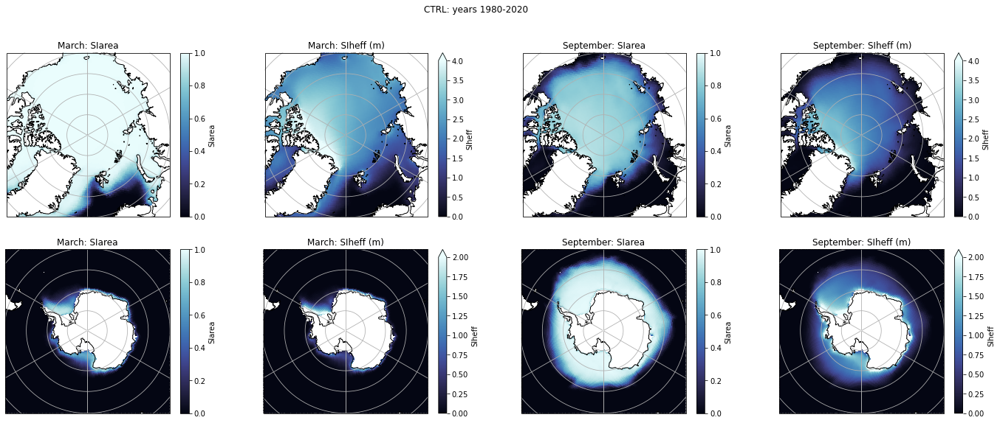

In [37]:
#plt.close('all')
k=0
rname=rnames[k]
spring=monthlyClim[k].sel(month=3)
fall  =monthlyClim[k].sel(month=9)

#proj=cart.crs.Orthographic(-80, 35)#central_longitude=180.0-19) #central_longitude=7.0)
nproj=cart.crs.NorthPolarStereo()
sproj=cart.crs.SouthPolarStereo()
nextent=[-180, 180, 70, 90]
sextent=[-180, 180, -90, -50]

mask2d=spring.hFacC.isel(k=0)

nrows=2
ncols=4
fig = plt.figure(figsize=(24,9))
# nrows=4
# ncols=2
# fig = plt.figure(figsize=(12,18))

ax=[]
# northern hemisphere
ax0 = fig.add_subplot(nrows,ncols,1, projection=nproj)
plot2dmap(ax0,spring,spring.SIarea.where(mask2d!=0.),colors.Normalize(vmin=0.,vmax=1.),
          tstr='March: SIarea',cmap=cmo.ice)
ax0.set_extent(nextent,cart.crs.PlateCarree())
ax.append(ax0)

ax0 = fig.add_subplot(nrows,ncols,2, projection=nproj)
plot2dmap(ax0,spring,spring.SIheff.where(mask2d!=0.),colors.Normalize(vmin=0.,vmax=4.),
          tstr='March: SIheff (m)',cmap=cmo.ice)
ax0.set_extent(nextent,cart.crs.PlateCarree())
ax.append(ax0)

ax0 = fig.add_subplot(nrows,ncols,3, projection=nproj)
plot2dmap(ax0,fall,fall.SIarea.where(mask2d!=0.),colors.Normalize(vmin=0.,vmax=1.),
          tstr='September: SIarea',cmap=cmo.ice)
ax0.set_extent(nextent,cart.crs.PlateCarree())
ax.append(ax0)

ax0 = fig.add_subplot(nrows,ncols,4, projection=nproj)
plot2dmap(ax0,fall,fall.SIheff.where(mask2d!=0.),colors.Normalize(vmin=0.,vmax=4.),
          tstr='September: SIheff (m)',cmap=cmo.ice)
ax0.set_extent(nextent,cart.crs.PlateCarree())
ax.append(ax0)

# southern hemisphere
ax0 = fig.add_subplot(nrows,ncols,5, projection=sproj)
plot2dmap(ax0,spring,spring.SIarea.where(mask2d!=0.),colors.Normalize(vmin=0.,vmax=1.),
          tstr='March: SIarea',cmap=cmo.ice)
ax0.set_extent(sextent,cart.crs.PlateCarree())
ax.append(ax0)

ax0 = fig.add_subplot(nrows,ncols,6, projection=sproj)
plot2dmap(ax0,spring,spring.SIheff.where(mask2d!=0.),colors.Normalize(vmin=0.,vmax=2.),
          tstr='March: SIheff (m)',cmap=cmo.ice)
ax0.set_extent(sextent,cart.crs.PlateCarree())
ax.append(ax0)

ax0 = fig.add_subplot(nrows,ncols,7, projection=sproj)
plot2dmap(ax0,fall,fall.SIarea.where(mask2d!=0.),colors.Normalize(vmin=0.,vmax=1.),
          tstr='September: SIarea',cmap=cmo.ice)
ax0.set_extent(sextent,cart.crs.PlateCarree())
ax.append(ax0)

ax0 = fig.add_subplot(nrows,ncols,8, projection=sproj)
plot2dmap(ax0,fall,fall.SIheff.where(mask2d!=0.),colors.Normalize(vmin=0.,vmax=2.),
          tstr='September: SIheff (m)',cmap=cmo.ice)
ax0.set_extent(sextent,cart.crs.PlateCarree())
ax.append(ax0)

#fig.suptitle('Simulation day %s'%(ds.time.sel(time=mytime).data.astype('datetime64[D]')))
fig.suptitle('%s: years %s-%s'%(rname,year0,year1))
fig.savefig(os.path.join(fdir,'seaice_%s_y%s'%(rname,year1)),dpi=300)

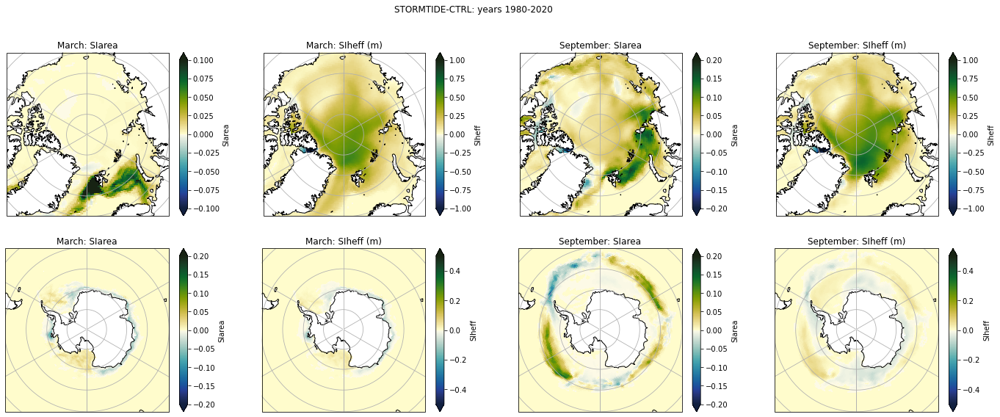

In [38]:
k0=0
k1=3
rname='%s-%s'%(rnames[k1],rnames[k0])
dmonthly = monthlyClim[k1]-monthlyClim[k0] 
spring=dmonthly.sel(month=3)
fall  =dmonthly.sel(month=9)

nproj=cart.crs.NorthPolarStereo()
sproj=cart.crs.SouthPolarStereo()
nextent=[-180, 180, 70, 90]
sextent=[-180, 180, -90, -50]

mask2d=monthlyClim[k0].hFacC.isel(k=0)

nrows=2
ncols=4
fig = plt.figure(figsize=(24,9))

ax=[]
# northern hemisphere
ax0 = fig.add_subplot(nrows,ncols,1, projection=nproj)
plot2dmap(ax0,spring,spring.SIarea.where(mask2d!=0.),colors.Normalize(vmin=-.1,vmax=.1),
          tstr='March: SIarea',cmap=cmo.delta)
ax0.set_extent(nextent,cart.crs.PlateCarree())
ax.append(ax0)

ax0 = fig.add_subplot(nrows,ncols,2, projection=nproj)
plot2dmap(ax0,spring,spring.SIheff.where(mask2d!=0.),colors.Normalize(vmin=-1.,vmax=1.),
          tstr='March: SIheff (m)',cmap=cmo.delta)
ax0.set_extent(nextent,cart.crs.PlateCarree())
ax.append(ax0)

ax0 = fig.add_subplot(nrows,ncols,3, projection=nproj)
plot2dmap(ax0,fall,fall.SIarea.where(mask2d!=0.),colors.Normalize(vmin=-0.2,vmax=0.2),
          tstr='September: SIarea',cmap=cmo.delta)
ax0.set_extent(nextent,cart.crs.PlateCarree())
ax.append(ax0)

ax0 = fig.add_subplot(nrows,ncols,4, projection=nproj)
plot2dmap(ax0,fall,fall.SIheff.where(mask2d!=0.),colors.Normalize(vmin=-1.,vmax=1.),
          tstr='September: SIheff (m)',cmap=cmo.delta)
ax0.set_extent(nextent,cart.crs.PlateCarree())
ax.append(ax0)

# southern hemisphere
ax0 = fig.add_subplot(nrows,ncols,5, projection=sproj)
plot2dmap(ax0,spring,spring.SIarea.where(mask2d!=0.),colors.Normalize(vmin=-0.2,vmax=0.2),
          tstr='March: SIarea',cmap=cmo.delta)
ax0.set_extent(sextent,cart.crs.PlateCarree())
ax.append(ax0)

ax0 = fig.add_subplot(nrows,ncols,6, projection=sproj)
plot2dmap(ax0,spring,spring.SIheff.where(mask2d!=0.),colors.Normalize(vmin=-0.5,vmax=0.5),
          tstr='March: SIheff (m)',cmap=cmo.delta)
ax0.set_extent(sextent,cart.crs.PlateCarree())
ax.append(ax0)

ax0 = fig.add_subplot(nrows,ncols,7, projection=sproj)
plot2dmap(ax0,fall,fall.SIarea.where(mask2d!=0.),colors.Normalize(vmin=-0.2,vmax=0.2),
          tstr='September: SIarea',cmap=cmo.delta)
ax0.set_extent(sextent,cart.crs.PlateCarree())
ax.append(ax0)

ax0 = fig.add_subplot(nrows,ncols,8, projection=sproj)
plot2dmap(ax0,fall,fall.SIheff.where(mask2d!=0.),colors.Normalize(vmin=-0.5,vmax=0.5),
          tstr='September: SIheff (m)',cmap=cmo.delta)
ax0.set_extent(sextent,cart.crs.PlateCarree())
ax.append(ax0)

#fig.suptitle('Simulation day %s'%(ds.time.sel(time=mytime).data.astype('datetime64[D]')))
fig.suptitle('%s: years %s-%s'%(rname,year0,year1))
fig.savefig(os.path.join(fdir,'seaice_%s_y%s'%(rname,year1)),dpi=300)

Prandtl Number diagnostics

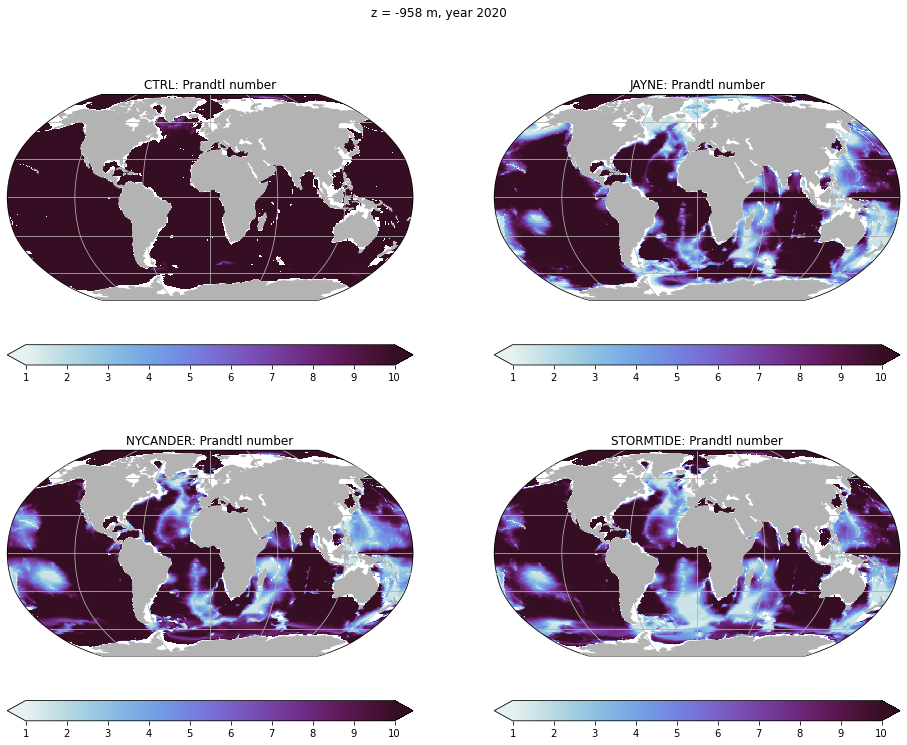

In [152]:
proj=cart.crs.Robinson()#central_longitude=180.0-19) #central_longitude=7.0)
#proj=cart.crs.PlateCarree() #central_longitude=161.)

kd=28
mytimeindex=-1
#dd = monthlyMaxMLD[k1] - monthlyMaxMLD[k0]
mask2d=(dss[0].hFacC.isel(k=kd+1)!=0.).compute()
# create instance of LLC-mapper
mapper = LLCMapper(coords) #, dx=1., dy=1.)

fig, ax = plt.subplots(nrows=2,ncols=2,sharex=True,sharey=True,figsize=(16,12),subplot_kw={'projection': proj})

ax = ax.flatten()
for k in range(len(dsm)):
    # March
    pnnorm = colors.Normalize(vmin=1,vmax=10)
    mapper(dsm[k].GGL90Prl.isel(k_l=kd).where(mask2d),ax=ax[k],norm=pnnorm,cmap=cmo.dense,
               tstr=rnames[k]+': Prandtl number')

thisyear=np.datetime_as_string(dss[0].time.isel(time=mytime), unit='Y')
fig.suptitle('z = %.0f m, year %s'%(dss[0].Zl[kd],thisyear))
fig.savefig(os.path.join(fdir,'prandlt_number_y%s'%(thisyear)),dpi=300)

# Sections

In [20]:
# jj=47
# iface=8
# np.concatenate(dss[0].YC[iface-1:iface+1,jj,:],axis=0)
ii=8
iface=3
ii=8
dss[0].XC[1,:,ii].values
dsm[0].GGL90KN2.max()

<xarray.DataArray 'GGL90KN2' ()>
array(6.4621753e-07, dtype=float32)

In [65]:
def get_log_clevs(clim, dosym=False, numspaces=5):
    clim = np.sort(np.array(clim, dtype=float))
    conts = np.power(10, np.arange(clim[0], clim[1]+1./numspaces,1./numspaces))
    linthresh = conts.min()
    if dosym:
        conts = np.concatenate((-conts[::-1], [0.], conts))
    if not dosym:
        norm = colors.LogNorm(vmin=10**clim[0], vmax=10**clim[1])
    else:
        norm = colors.SymLogNorm(linthresh=linthresh, linscale=1.,
                          vmin=clim[0], vmax=clim[1], base=10)
    return clim, norm, conts

def plotsec30(ax,ds,fld,cnorm,tstr='dummy',cmap=None):
    ii=7
    iface=3
    fld0=np.concatenate((fld[:,0,:,ii],fld[:,1,:,ii],fld[:,2,:,ii]),axis=1)
    y = np.concatenate((ds.YC[0,:,ii],ds.YC[1,:,ii],ds.YC[2,:,ii]),axis=0)
    d = np.concatenate(ds.Depth[:iface,:,ii],axis=0)
    csf=ax.pcolormesh(y,ds.Z,fld0,norm=cnorm,cmap=cmap)
    ax.fill_between(y,-d,-ds.Depth.max(),step='mid',facecolor='lightgrey')
    plt.colorbar(csf,ax=ax,orientation='vertical')
    ax.set_title('%s, section along %i E'%(tstr,ds.XC.sel(face=1,i=ii).mean()))

def plotsec170(ax,ds,fld,cnorm,tstr='dummy',cmap=None):
    jj=47
    fld0=np.concatenate((fld[:,7,jj,:],fld[:,8,jj,:],fld[:,9,jj,:]),axis=1)[:,:-30]
    y = np.concatenate(ds.YC[7:10,jj,:],axis=0)[:-30]
    d = np.concatenate(ds.Depth[7:10,jj,:],axis=0)[:-30]    
    csf=ax.pcolormesh(y,ds.Z,fld0,norm=cnorm,cmap=cmap)
    ax.fill_between(y,-d,-ds.Depth.max(),step='mid',facecolor='lightgrey')
    #plt.colorbar(csf,ax=ax,orientation='vertical')
    ax.set_title('%s, section along %i E'%(tstr,ds.XC.sel(face=8,j=jj).mean()))
    
def plotsec170c(ax,ds,fld,cnorm,levs,tstr='dummy',cmap=None):
    jj=47
    fld0=np.concatenate((fld[:,7,jj,:],fld[:,8,jj,:],fld[:,9,jj,:]),axis=1)[:,:-30]
    y = np.concatenate(ds.YC[7:10,jj,:],axis=0)[:-30]
    d = np.concatenate(ds.Depth[7:10,jj,:],axis=0)[:-30]
    csf=ax.contourf(y,ds.Z,fld0,levels=levs,norm=cnorm,cmap=cmap,extend='both')
    ax.fill_between(y,-d,-ds.Depth.max(),step='mid',facecolor='lightgrey')
    #cax = plt.colorbar(csf,ax=ax,orientation='vertical')
    ax.set_title('%s, section along %i E'%(tstr,ds.XC.sel(face=8,j=jj).mean()))
    return csf
    

In [66]:
dsm[0]

<xarray.Dataset>
Dimensions:               (i: 90, i_g: 90, j: 90, j_g: 90, k: 50, k_u: 50, k_l: 50, k_p1: 51, face: 13, l1_b: 89, l1_c: 88, l1_i: 87)
Coordinates: (12/49)
  * i                     (i) int64 0 1 2 3 4 5 6 7 ... 82 83 84 85 86 87 88 89
  * i_g                   (i_g) int64 0 1 2 3 4 5 6 7 ... 83 84 85 86 87 88 89
  * j                     (j) int64 0 1 2 3 4 5 6 7 ... 82 83 84 85 86 87 88 89
  * j_g                   (j_g) int64 0 1 2 3 4 5 6 7 ... 83 84 85 86 87 88 89
  * k                     (k) int64 0 1 2 3 4 5 6 7 ... 42 43 44 45 46 47 48 49
  * k_u                   (k_u) int64 0 1 2 3 4 5 6 7 ... 43 44 45 46 47 48 49
    ...                    ...
    dxF                   (face, j, i) float32 ...
    rhoRef                (k) float32 1.024e+03 1.024e+03 ... 1.054e+03
    dyU                   (face, j_g, i_g) float32 ...
    layer_1RHO_bounds     (l1_b) float32 0.0 30.0 30.5 31.0 ... 39.31 39.65 40.0
    layer_1RHO_center     (l1_c) float32 15.0 30.25 30.75 ... 39.14 39.48 39.83
    layer_1RHO_interface  (l1_i) float32 30.0 30.5 31.0 ... 38.96 39.31 39.65
Data variables: (12/18)
    GGL90KN2              (k_l, face, j, i) float32 ...
    GGL90TKE              (k_l, face, j, i) float32 ...
    GGL90Lmx              (k_l, face, j, i) float32 ...
    GGL90Prl              (k_l, face, j, i) float32 ...
    GGL90Kr               (k_l, face, j, i) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
    GGL90ArU              (k_l, face, j, i) float32 ...
    ...                    ...
    SALT                  (k, face, j, i) float32 ...
    DRHODR                (k_l, face, j, i) float32 ...
    UVEL                  (k, face, j, i_g) float32 ...
    VVEL                  (k, face, j_g, i) float32 ...
    WVEL                  (k_l, face, j, i) float32 ...
    LaTr1RHO              (k, face, j, i) float32 ...

## Vertical diffusivity

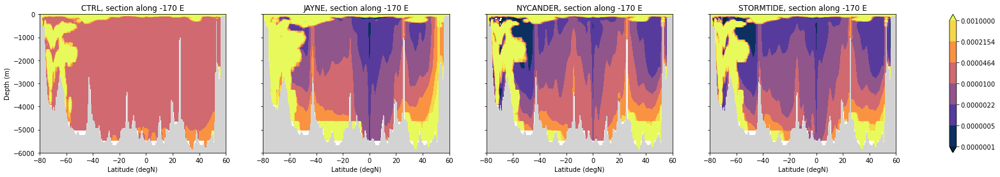

In [68]:
#plt.close()
mytime=-1

fig,ax=plt.subplots(1,4,figsize=(30,4),sharex=True,sharey=True);
vmin, vmax, ncont = -7, -3, 7
cnorm = colors.LogNorm(vmin=10**vmin,vmax=10**vmax)
levels = np.logspace(vmin,vmax,ncont)

for k,ds in enumerate(dsm):
    msk = ds.hFacC.where(ds.hFacC>0).values
    myfld = ds.GGL90Kr*msk
    myfld = myfld.where(myfld!=0).values
    #levels = np.power(10, np.arange(vmin, vmax+1./numspaces,1./numspaces))
    im = plotsec170c( ax[k],ds,myfld,cnorm,levels,'%s'%(rnames[k]),cmap=cmo.thermal)
#    plotsec170( ax[k],ds,myfld,cnorm,'%s'%(rnames[k]),cmap=cmo.thermal)


for b in ax[:]: 
    b.set_xlabel('Latitude (degN)')
    b.set_ylim([-6000,0])
    b.set_xlim([-80, 60])
ax[0].set_ylabel('Depth (m)')

fig.colorbar(im, ax=ax.ravel().tolist(), extend='both')

#thisyear=np.datetime_as_string(dss[0].time.isel(time=mytime), unit='Y')
#fig.suptitle('year %s'%(thisyear))

fname='mitgcm_diffusivity_170w'
fig.savefig(os.path.join(fdir,fname),dpi=300)

In [40]:
np.logspace(vmin,vmax,5)

array([1.00000000e-05, 3.16227766e-05, 1.00000000e-04, 3.16227766e-04,
       1.00000000e-03])

## Buoyancy production

In [ ]:
mytime=-1

fig,ax=plt.subplots(1,4,figsize=(24,6),sharex=True,sharey=True);
for k,ds in enumerate(dsm):
    msk = ds.hFacC.where(ds.hFacC>0).values
    myfld = ds.GGL90KN2*msk
    myfld = myfld.where(myfld!=0).values
    cnorm = colors.SymLog(vmin=-1e-8,vmax=1e-8)
    plotsec30( ax[0,k],ds,myfld,cnorm,'%s: K N^2'%(rnames[k]),cmap=cmo.dense)
    plotsec170(ax[1,k],ds,myfld,cnorm,'%s: K N^2'%(rnames[k]),cmap=cmo.dense)

for b in ax[1,:]: b.set_xlabel('Latitude (degN)')
for b in ax[:,0]: b.set_ylabel('Z (m)')

thisyear=np.datetime_as_string(dss[0].time.isel(time=mytime), unit='Y')
fig.suptitle('year %s'%(thisyear))



In [34]:
np.logspace(-5,-3,11)

array([1.00000000e-05, 1.58489319e-05, 2.51188643e-05, 3.98107171e-05,
       6.30957344e-05, 1.00000000e-04, 1.58489319e-04, 2.51188643e-04,
       3.98107171e-04, 6.30957344e-04, 1.00000000e-03])

/tmp/ipykernel_97365/3559268236.py:7: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  csf=ax.pcolormesh(y,ds.Z,fld0,norm=cnorm,cmap=cmap)
/tmp/ipykernel_97365/3559268236.py:7: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  csf=ax.pcolormesh(y,ds.Z,fld0,norm=cnorm,cmap=cmap)
/tmp/ipykernel_97365/3559268236.py:7: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  csf=ax.pcolormesh(y,ds.Z,f

Text(0.5, 0.98, 'year 2020')

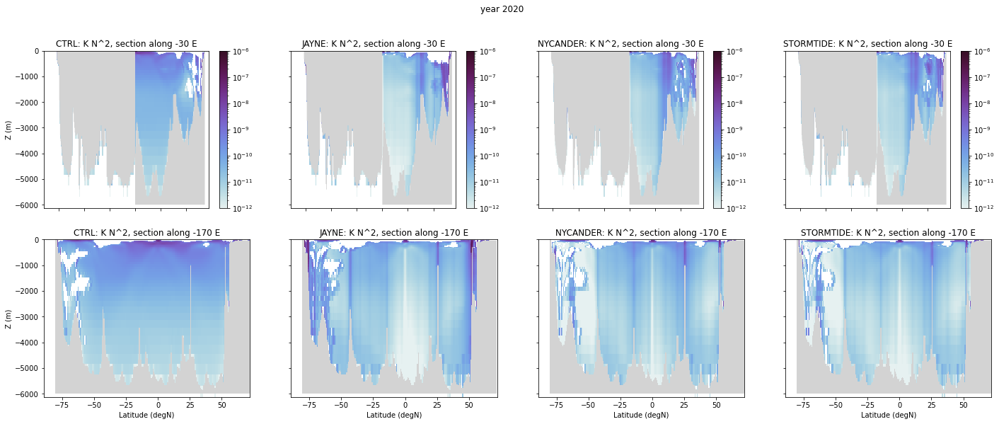

In [92]:
plt.close()
mytime=-1

fig,ax=plt.subplots(2,4,figsize=(24,9),sharex=True,sharey=True);
for k,ds in enumerate(dsm):
    msk = ds.hFacC.where(ds.hFacC>0).values
    #myfld = ds.GGL90Prl.isel(time=mytime)*msk
    myfld = ds.GGL90KN2*msk
    myfld = myfld.where(myfld!=0).values
    cnorm = colors.LogNorm(vmin=1e-12,vmax=1e-6)
    plotsec30( ax[0,k],ds,myfld,cnorm,'%s: K N^2'%(rnames[k]),cmap=cmo.dense)
    plotsec170(ax[1,k],ds,myfld,cnorm,'%s: K N^2'%(rnames[k]),cmap=cmo.dense)

for b in ax[1,:]: b.set_xlabel('Latitude (degN)')
for b in ax[:,0]: b.set_ylabel('Z (m)')

thisyear=np.datetime_as_string(dss[0].time.isel(time=mytime), unit='Y')
fig.suptitle('year %s'%(thisyear))
#fig.savefig(os.path.join(fdir,'prandlt_number_sections_y%s'%(thisyear)),dpi=300)

In [52]:
# import gc 
# gc.collect()
#del ds0
iters=[17520, 35040, 52608, 70128]
iters=[4824]
iters='all'
wdir='/work/ollie/mlosch/idemix_test/llc90/test'
ds0 = open_mdsdataset(wdir,prefix=['diags3D','diagsGGL90'],delta_t=deltat,ref_date='1958-1-1 0:0:0',geometry='llc',iters=iters)
print(ds0.time)
ds0

<xarray.DataArray 'time' (time: 1)>
array(['1959-01-01T00:00:00.000000000'], dtype='datetime64[ns]')
Coordinates:
    iter     (time) int64 8760
  * time     (time) datetime64[ns] 1959-01-01
Attributes:
    standard_name:  time
    long_name:      Time
    axis:           T


<xarray.Dataset>
Dimensions:               (i: 90, i_g: 90, j: 90, j_g: 90, k: 50, k_u: 50, k_l: 50, k_p1: 51, face: 13, l1_b: 89, l1_c: 88, l1_i: 87, time: 1)
Coordinates: (12/51)
  * i                     (i) int64 0 1 2 3 4 5 6 7 ... 82 83 84 85 86 87 88 89
  * i_g                   (i_g) int64 0 1 2 3 4 5 6 7 ... 83 84 85 86 87 88 89
  * j                     (j) int64 0 1 2 3 4 5 6 7 ... 82 83 84 85 86 87 88 89
  * j_g                   (j_g) int64 0 1 2 3 4 5 6 7 ... 83 84 85 86 87 88 89
  * k                     (k) int64 0 1 2 3 4 5 6 7 ... 42 43 44 45 46 47 48 49
  * k_u                   (k_u) int64 0 1 2 3 4 5 6 7 ... 43 44 45 46 47 48 49
    ...                    ...
    dyU                   (face, j_g, i_g) >f4 dask.array<chunksize=(1, 90, 90), meta=np.ndarray>
    dxF                   (face, j, i) >f4 dask.array<chunksize=(1, 90, 90), meta=np.ndarray>
    rhoRef                (k) >f4 1.024e+03 1.024e+03 ... 1.052e+03 1.054e+03
    layer_1RHO_bounds     (l1_b) >f4 0.0 30.0 30.5 31.0 ... 39.31 39.65 40.0
    layer_1RHO_center     (l1_c) float32 15.0 30.25 30.75 ... 39.14 39.48 39.83
    layer_1RHO_interface  (l1_i) >f4 30.0 30.5 31.0 31.5 ... 38.96 39.31 39.65
Data variables:
    GGL90TKE              (time, k_l, face, j, i) >f4 dask.array<chunksize=(1, 1, 1, 90, 90), meta=np.ndarray>
    GGL90Lmx              (time, k_l, face, j, i) >f4 dask.array<chunksize=(1, 1, 1, 90, 90), meta=np.ndarray>
    GGL90Prl              (time, k_l, face, j, i) >f4 dask.array<chunksize=(1, 1, 1, 90, 90), meta=np.ndarray>
    GGL90Kr               (time, k_l, face, j, i) >f4 dask.array<chunksize=(1, 1, 1, 90, 90), meta=np.ndarray>
    GGL90ArU              (time, k_l, face, j, i) >f4 dask.array<chunksize=(1, 1, 1, 90, 90), meta=np.ndarray>
    GGL90ArV              (time, k_l, face, j, i) >f4 dask.array<chunksize=(1, 1, 1, 90, 90), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    title:        netCDF wrapper of MITgcm MDS binary data
    source:       MITgcm
    history:      Created by calling `open_mdsdataset(grid_dir=None, iters='a...

Text(0.5, 0.98, '1958-04-01')

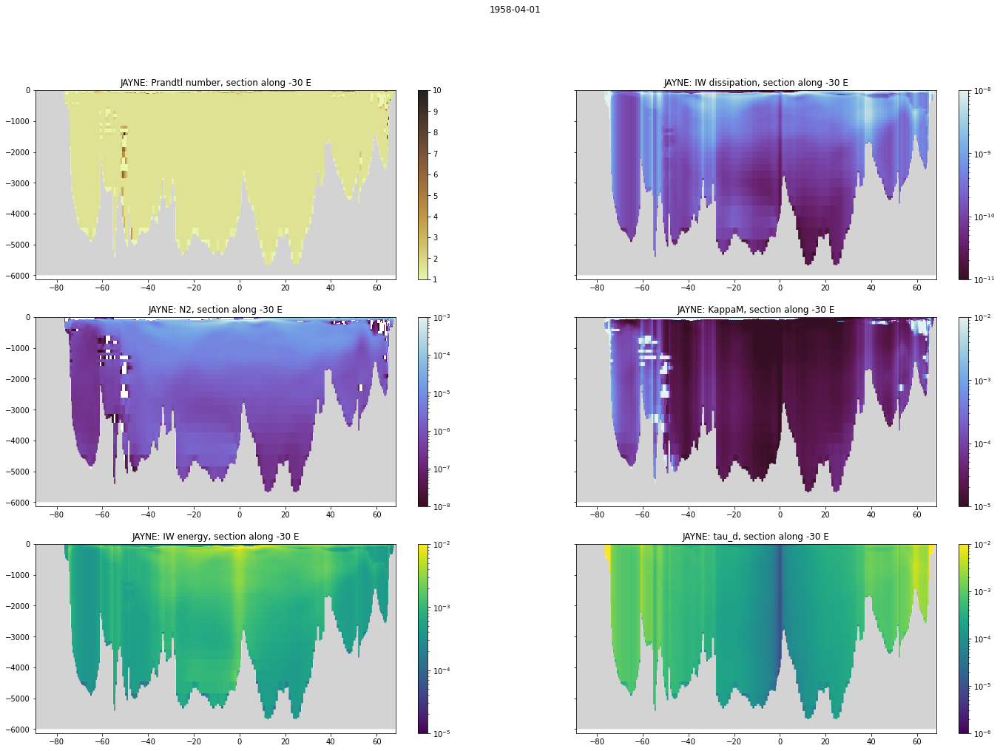

In [15]:
import gc 
gc.collect()

import matplotlib.cm as cm
plt.close();
gr=9.81/1035.
fig,ax=plt.subplots(3,2,figsize=(24,16),sharex=False,sharey=True)
ax=ax.flatten()

mytime = 180
ds = ds0.isel(time=mytime)
msk = ds.hFacC.where(ds.hFacC>0).values
iwdiss = ds.IDEMIX_t*(ds.IDEMIX_E)**2
N2 = -gr*ds.DRHODR
kappaM = 0.1*ds.GGL90Lmx*np.sqrt(ds.GGL90TKE)

#vname = 'UVEL'; myfld = ds.UVEL*msk; cnorm=colors.Normalize(vmin=-.5,vmax=.5); cmap=cmo.delta
#vname = 'N2'; myfld = -gr*ds.DRHODR*msk; cnorm=colors.LogNorm(vmin=1e-8,vmax=1e-3); cmap = cmo.dense_r
#vname = 'IW energy'; myfld = ds.IDEMIX_E*msk; cnorm=colors.LogNorm(vmin=1e-5,vmax=1e-2); cmap = cm.viridis
#vname = 'IW dissipation'; myfld = iwdiss*msk; cnorm=colors.LogNorm(vmin=1e-11,vmax=1e-8); cmap = cmo.dense_r
#vname = 'tau_d'; myfld = ds.IDEMIX_t*msk; cnorm=colors.LogNorm(vmin=1e-6,vmax=1e-2); cmap = cm.jet
vname = 'Prandtl number'; myfld = ds.GGL90Prl*msk; cnorm=colors.Normalize(vmin=1,vmax=10); cmap = cmo.turbid
#vname = 'RI_idemix'; myfld = 6.6*kappaM*N2/(2.23e-16+iwdiss)*msk; cnorm=colors.Normalize(vmin=0,vmax=10); cmap = cmo.turbid
myfld = myfld.where(myfld!=0).values
plotsec30(ax[0],dss[1],myfld,cnorm,'%s: %s'%(rnames[1],vname),cmap=cmap)
vname = 'IW dissipation'; myfld = iwdiss*msk; cnorm=colors.LogNorm(vmin=1e-11,vmax=1e-8); cmap = cmo.dense_r
myfld = myfld.where(myfld!=0).values
plotsec30(ax[1],dss[1],myfld,cnorm,'%s: %s'%(rnames[1],vname),cmap=cmap)
vname = 'N2'; myfld = -gr*ds.DRHODR*msk; cnorm=colors.LogNorm(vmin=1e-8,vmax=1e-3); cmap = cmo.dense_r
myfld = myfld.where(myfld!=0).values
plotsec30(ax[2],dss[1],myfld,cnorm,'%s: %s'%(rnames[1],vname),cmap=cmap)
vname = 'KappaM'; myfld = kappaM*msk; cnorm=colors.LogNorm(vmin=1e-5,vmax=1e-2); cmap = cmo.dense_r
myfld = myfld.where(myfld!=0).values
plotsec30(ax[3],dss[1],myfld,cnorm,'%s: %s'%(rnames[1],vname),cmap=cmap)
vname = 'IW energy'; myfld = ds.IDEMIX_E*msk; cnorm=colors.LogNorm(vmin=1e-5,vmax=1e-2); cmap = cm.viridis
myfld = myfld.where(myfld!=0).values
plotsec30(ax[4],dss[1],myfld,cnorm,'%s: %s'%(rnames[1],vname),cmap=cmap)
vname = 'tau_d'; myfld = ds.IDEMIX_t*msk; cnorm=colors.LogNorm(vmin=1e-6,vmax=1e-2); cmap = cm.viridis
myfld = myfld.where(myfld!=0).values
plotsec30(ax[5],dss[1],myfld,cnorm,'%s: %s'%(rnames[1],vname),cmap=cmap)

thistime=np.datetime_as_string(ds0.time.isel(time=mytime), unit='D')
fig.suptitle('%s'%(thistime))


Text(0.5, 0.98, 'year 2020')

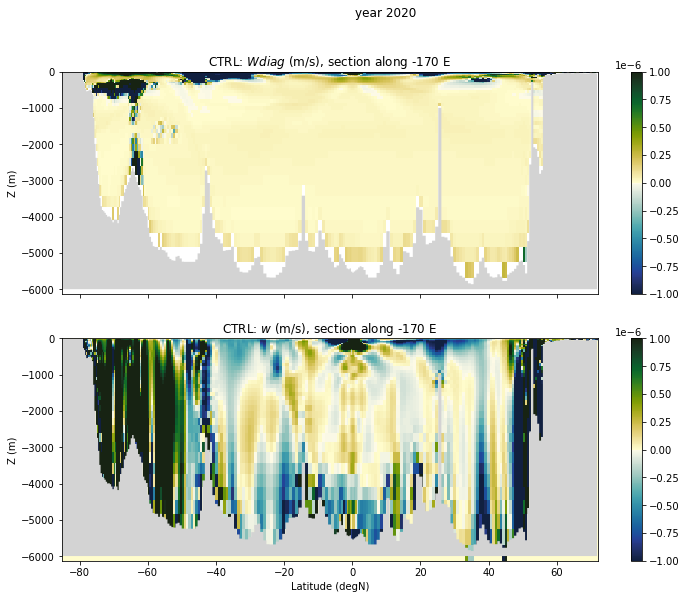

In [166]:
plt.close()
mytime=-1

fig,ax=plt.subplots(2,1,figsize=(12,9),sharex=True,sharey=True);
k=0
ds = dsm[k]
# ds = open_mdsdataset(rdirs[0],prefix=['diags3D','diagsGGL90'],iters=[175296,5434800],
#                       delta_t=deltat,ref_date=refdate,geometry='llc') 
ds.coords['XC'] = grid.XC
ds.coords['YC'] = grid.YC
ds.coords['XG'] = grid.XG
ds.coords['YG'] = grid.YG
N2=-9.81/1035 * 0.5*(ds.DRHODR+np.roll(ds.DRHODR,-1,axis=0))
msk = ds.hFacC.where(ds.hFacC>0).values
myfld = ds.GGL90KN2*msk
#myfld = ds.GGL90Kr*N2*msk
myfld = myfld.where(myfld!=0).values
cnorm = colors.LogNorm(vmin=1e-12,vmax=1e-6)
wnorm = colors.Normalize(vmin=-1e-6,vmax=1e-6)
#plotzonalmean(ax[0],ds,abs(ds.GGL90KN2),np.logspace(-12,-7,21),indopacific_mask,'%s: $K\cdot N^2$ (m$^{2}\,$s$^{-3}$)'%rnames[k],cmap=cmo.dense)
#plotsec30( ax[0],ds,myfld,cnorm,'%s: $K\cdot N^2$'%(rnames[k]),cmap=cmo.dense)
dkNdz= (myfld-np.roll(myfld,-1,axis=0))/np.tile(np.reshape(ds.drF.values,(50,1,1,1)),(1,13,90,90))
wdiag= dkNdz/N2
plotsec170(ax[0],ds,wdiag,wnorm,'%s: $Wdiag$ (m/s)'%(rnames[k]),cmap=cmo.delta)
#plotzonalmean(ax[1],ds,ds.WVEL,-np.logspace(-8,-4,21),indopacific_mask,'%s: $w$ / (m\,$s$^{-1}$)'%rnames[k],cmap=cmo.delta)
plotsec170(ax[1],ds,ds.WVEL,wnorm,'%s: $w$ (m/s)'%(rnames[k]),cmap=cmo.delta)
ax[1].set_xlabel('Latitude (degN)')
for b in ax: b.set_ylabel('Z (m)')

thisyear=np.datetime_as_string(dss[0].time.isel(time=mytime), unit='Y')
fig.suptitle('year %s'%(thisyear))



In [141]:
wdiag= (myfld-np.roll(myfld,-1,axis=0))/np.tile(np.reshape(ds.drF.values,(50,1,1,1)),(1,13,90,90)) /N2

wfld=xr.where(np.isnan(wdiag),0,wdiag)
print(wfld.shape)

(50, 13, 90, 90)


Text(0.5, 1.0, 'GMOC / Sv')

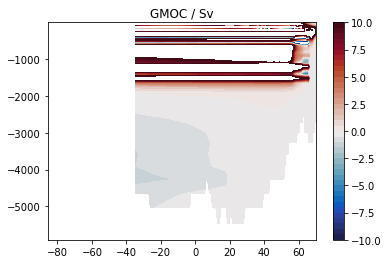

In [154]:
mocstrf = compute_moc(wfld*(ds.rA*atlantic_mask)*1e-6)

fig=plt.figure();
y = xr.concat([coords.YG.isel(face= 0),coords.YG.isel(face= 1),coords.YG.isel(face= 2)], dim='j_g').mean(dim='i_g')
plt.contourf(y,ds.Z,sq(mocstrf),levels=np.linspace(-10,10,41),cmap=cmo.balance)
plt.colorbar()
plt.title('GMOC / Sv')

In [129]:
a=np.arange(5)
np.roll(a,-1)

array([1, 2, 3, 4, 0])

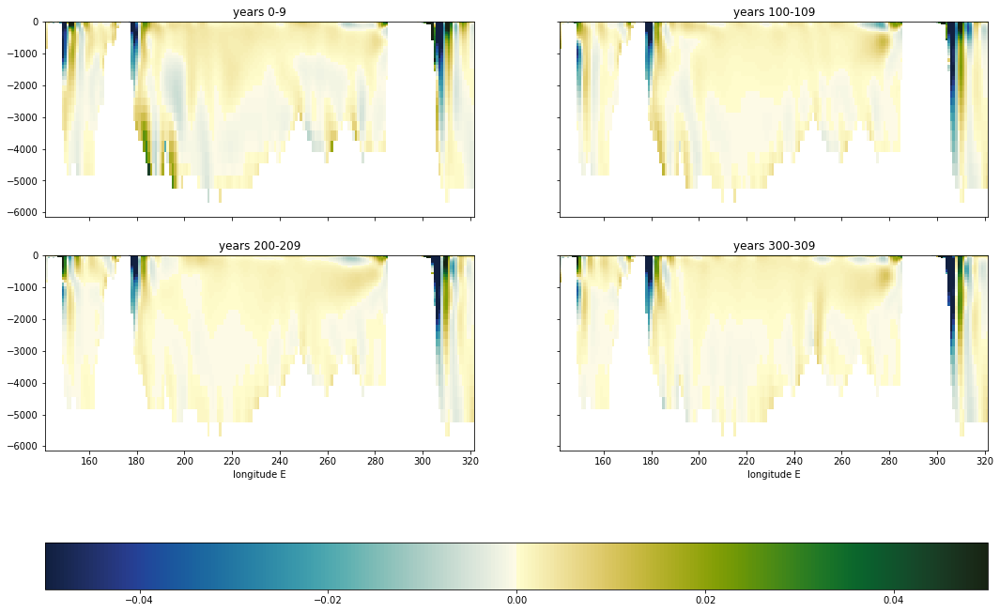

In [254]:
x = xr.concat([coords.XG.isel(face= 8),coords.XG.isel(face= 11)], dim='j_g')
y = xr.concat([coords.YC.isel(face= 8),coords.YC.isel(face= 11)], dim='j')
xs = np.where(x<0,x+360,x)
ii = 63
vm=5e-2

fig,ax=plt.subplots(2,2,figsize=(18,12),sharex=True,sharey=True);
ax=ax.ravel()
for k,y0 in enumerate([0,100,200,300]):
    mytime = list(np.arange(10)+y0)
    ds = dst[0].isel(time=mytime).mean(dim='time')
    var = -ds.UVEL
    u = xr.concat([var.isel(face= 8),var.isel(face= 11)], dim='j')

    im = ax[k].pcolormesh(xs[:,ii],ds.Z,u.where(u!=0)[:,:,ii],vmin=-vm,vmax=vm,cmap=cmo.delta)
    ax[k].set_title('years %i-%i'%(mytime[0],mytime[-1]))
    
ax[-2].set_xlabel('longitude E')
ax[-1].set_xlabel('longitude E')

cb = fig.colorbar(im, ax=ax, orientation='horizontal',shrink = 0.7,extend='both')
#cb.set_clim(-0.05,0.05)

In [253]:
im.set_clim(0,4)